# Notebook Structure

1.Problem Statement and Data Description\
2.Loading Datasets and Libraries\
3.Understanding and Validating the Data\
4.Data Exploration - Train, Product, Store

# 1. Problem Statement and Data Description
**Problem Statement**: Prevent overstocking and understocking of Items by forecasting demand of items for the next week, based on historical data.
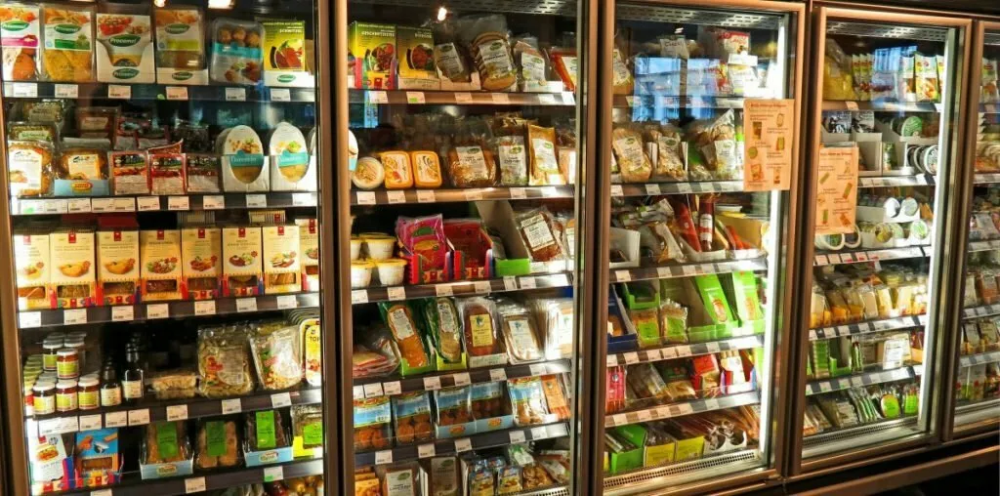

**Data Description:**

Train Data- 
- **WEEK_END_DATE** - week ending date
- **STORE_NUM** - store number
- **UPC** - (Universal Product Code) product specific identifier
- **BASE_PRICE** - base price of item
- **DISPLAY** - product was a part of in-store promotional display
- **FEATURE** - product was in in-store circular
- **UNITS** - units sold (target)

Product Data-
- **UPC** - (Universal Product Code) product specific identifier
- **DESCRIPTION**	- product description
- **MANUFACTURER** - product	manufacturer
- **CATEGORY** - category of product
- **SUB_CATEGORY** - sub-category of product
- **PRODUCT_SIZE** - package size or quantity of product

Store Data-
- **STORE_ID** - store number
- **STORE_NAME** - Name of store
- **ADDRESS_CITY_NAME** - city
- **ADDRESS_STATE_PROV_CODE** - state
- **MSA_CODE** - (Metropolitan Statistical Area) Based on geographic region and population density
- **SEG_VALUE_NAME** - Store Segment Name
- **PARKING_SPACE_QTY** - number of parking spaces in the store parking lot
- **SALES_AREA_SIZE_NUM** - square footage of store
- **AVG_WEEKLY_BASKETS** - average weekly baskets sold in the store

# 2.Loading Required Libraries and Datasets

In [1]:
#Data manupulation Libraries
import numpy as np
import pandas as pd

#Data vizulization Libraries
import matplotlib.pyplot as plt
import seaborn as sns

#Ignoring Warning library
import warnings

#random library
import random
sns.set_context('notebook',font_scale=1.5)

warnings.filterwarnings('ignore')

We are provided with three tables containing the required information:

- **product_data**: Consists of details about the product
- **store_data**: Consists of details of various stores associated with the retailer  
- **train**: Contains transaction data of products

In [2]:
#Reding the data file 
train = pd.read_csv(r"C:\Users\USER\3D Objects\KSR_projects\project for retail market\train.csv")
product_data = pd.read_csv(r"C:\Users\USER\3D Objects\KSR_projects\project for retail market\product_data.csv")
store_data = pd.read_csv(r"C:\Users\USER\3D Objects\KSR_projects\project for retail market\store_data.csv")

In [3]:
#cheking the dimension of the given data frames like (Rows,columns)
print("train_shape:",train.shape)
print("product_data_shape:",product_data.shape)
print("Store_data_shape:",store_data.shape)

train_shape: (232287, 8)
product_data_shape: (30, 6)
Store_data_shape: (76, 9)


- **product_data**: Contains the __(rows:232287, Columns:8)__
- **store_data**:  Contains the __(rows:30, Columns:6)__
- **train**:  Contains the __(rows:76, Columns:9)__

# UnderStanding the Validating Data

In [4]:
train.head()

,WEEK_END_DATE,STORE_NUM,UPC,PRICE,BASE_PRICE,FEATURE,DISPLAY,UNITS
0,14-Jan-09,367,1111009477,1.39,1.57,0,0,13
1,14-Jan-09,367,1111009497,1.39,1.39,0,0,20
2,14-Jan-09,367,1111085319,1.88,1.88,0,0,14
3,14-Jan-09,367,1111085345,1.88,1.88,0,0,29
4,14-Jan-09,367,1111085350,1.98,1.98,0,0,35


__Checking the data types__

In [5]:
train.dtypes

WEEK_END_DATE     object
STORE_NUM          int64
UPC                int64
PRICE            float64
BASE_PRICE       float64
FEATURE            int64
DISPLAY            int64
UNITS              int64
dtype: object

- WEEK_END_DATE has the data type object, but its a datetime variable 
- The store number and product codes are read as int, but these are categorical variables.

#### Datetime variable 

- The data is captured for what duration?
- What are the start and end dates?
- Is there any missing data points?

#### Numerical Variables

- Check the distribution of numerical variables
- Are there any extreme values?
- Are there any missing values in the variables?

#### Categorical Variables

- Check the unique values for categorical variables
- Are there any missing values in the variables?
- Is there any variable with high cardinality/ sparsity?


#### WEEK_END_DATE : it is in object to convert into date time format

In [6]:
#Convert into the date time format
train["WEEK_END_DATE"] = pd.to_datetime(train["WEEK_END_DATE"])  

In [7]:
#Checking the missing values
train["WEEK_END_DATE"].isnull().sum()

0

__There is no missing values in WEEK_END_DATE__

### What are the start and end dates?

In [8]:
train["WEEK_END_DATE"].min(),train["WEEK_END_DATE"].max()

(Timestamp('2009-01-14 00:00:00'), Timestamp('2011-09-28 00:00:00'))

In [9]:
print("Starting date:", train["WEEK_END_DATE"].iloc[0])
print("Ending date:", train["WEEK_END_DATE"].iloc[-1])

Starting date: 2009-01-14 00:00:00
Ending date: 2011-09-28 00:00:00


- The data collected is from __14-January-2009 to 28-September-2011.__

#### Are any dates missing from this period?

In [10]:
(train['WEEK_END_DATE'].max() - train['WEEK_END_DATE'].min())/7

Timedelta('141 days 00:00:00')

In [11]:
train["WEEK_END_DATE"].nunique()

142

- The training data is for 142 weeks, based on the number of unique *weekend dates* in the train file. 
- No dates are missing from this period.

#### Are all dates at a gap of a week?

In [12]:
train['WEEK_END_DATE'].dt.day_name().value_counts()

WEEK_END_DATE
Wednesday    232287
Name: count, dtype: int64

### Summary of WEEK_END_DATE:
1) - The data collected is from __14-January-2009 to 28-September-2011.__ \
2) - The wekkly information is 142 weeks all the data will captured by the __wednesday__\
3) - there is no missing vales 


### STORE_NUM and UPC

In [13]:
train[["STORE_NUM","UPC"]].isnull().sum()

STORE_NUM    0
UPC          0
dtype: int64

In [14]:
train["STORE_NUM"].nunique()

76

In [15]:
(train["STORE_NUM"].value_counts().sort_values())

STORE_NUM
8035     1676
23055    1823
2523     1977
11967    2104
15755    2253
         ... 
2277     3824
21237    3950
9825     3955
24991    3967
2513     4098
Name: count, Length: 76, dtype: int64

- We have the 76 unique stores.
- Every store has Minimum of 1676 transaction 

#### Does each store hold atleast one entry per week?

We have 76 unique stores and 142 weeks of data for the sales. If each store is selling occupies atleast one row in the data, the minimum number of unique rows should be 142*76

In [16]:
train.head()

,WEEK_END_DATE,STORE_NUM,UPC,PRICE,BASE_PRICE,FEATURE,DISPLAY,UNITS
0,2009-01-14,367,1111009477,1.39,1.57,0,0,13
1,2009-01-14,367,1111009497,1.39,1.39,0,0,20
2,2009-01-14,367,1111085319,1.88,1.88,0,0,14
3,2009-01-14,367,1111085345,1.88,1.88,0,0,29
4,2009-01-14,367,1111085350,1.98,1.98,0,0,35


In [17]:
142*76

10792

In [18]:
train[['WEEK_END_DATE','STORE_NUM']].drop_duplicates().shape

(10792, 2)

#### Implies that each store is atleast selling 1 product each week 

In [19]:
print(train["UPC"].unique())

[ 1111009477  1111009497  1111085319  1111085345  1111085350  1111087395
  1111087396  1111087398  1600027527  1600027528  1600027564  3800031829
  3800031838  3800039118  7192100337  7192100339  1111009507  1111038078
  1111038080  2840004768  2840004770  7192100336  7797502248  7797508006
 31254742835  7218063052  7797508004  3700044982  3700031613 31254742735]


In [20]:
train["UPC"].nunique()

30

In [21]:
(train['UPC'].value_counts()).sort_values()

UPC
3700044982       975
3700031613      1664
31254742835     2086
7797508004      2386
1111038080      2797
7797508006      2933
31254742735     3202
7218063052      3641
7797502248      6916
1111038078      7131
2840004770      7636
1111009507      8067
1111087396      8131
1111087395      8155
2840004768      8488
7192100336      9126
1111087398      9989
1111009477     10356
1111009497     10498
7192100337     10588
1111085319     10636
3800031829     10640
3800039118     10766
7192100339     10767
1111085350     10775
3800031838     10785
1600027564     10786
1600027528     10788
1111085345     10789
1600027527     10790
Name: count, dtype: int64

#### Is every product sold atleast once, for all 142 weeks?

In [22]:
142*30

4260

In [23]:
train[["WEEK_END_DATE","UPC"]].drop_duplicates().shape

(4260, 2)

- We have 30 unique products in the training data
- There are 76 different stores associated with the retailer
- Both the variables do not have any missing values

#### Is each store selling each product throughout the given period?

Assuming we have information for the sale of every product that is present in the product table (30), against each store associated (76), and for every week (142); we should have 142*76*30 data rows. 

In [24]:
142*76*30

323760

In [25]:
train.shape

(232287, 8)

In [26]:
(232287/323760)*100

71.74666419570052

- We can conclude that all stores are not selling all products each week
- Of all the possible combinations, about 72% of the data is present

#### For a store selling a particular product, do we have more than one entry?


Each product sold by any store should hold only one row, i.e. a particular store, say 'store A' selling a product 'prod P' should contribute a single row for every week. Let us check that.

In [27]:
train.shape

(232287, 8)

In [28]:
train[["WEEK_END_DATE","STORE_NUM","UPC"]].drop_duplicates().shape

(232287, 3)

In [29]:
train.groupby(["WEEK_END_DATE","STORE_NUM"])["UPC"].count().mean()

21.523999258710155

- The shape does not change after using drop duplicates
- Implies that there are unique combinations for week, store and UPC
- On an average, each week we are selling 22 products

#### Is a store selling a product throughout the period or is there a break?

In [30]:
(train.groupby(['STORE_NUM', 'UPC'])['UNITS'].count()).sort_values()

STORE_NUM  UPC       
4489       1111087396    137
19265      7797508006    137
21221      7797508004    137
6187       1111038080    137
23349      2840004768    137
                        ... 
11993      1111085345    142
           1111085319    142
           1111038080    142
           1600027564    142
29159      7797508004    142
Name: UNITS, Length: 1644, dtype: int64

- Not all stores sell a product throughout the week
- The minimum number is 137/142

We now have a basic understanding of the number of products and stores we are dealing with in this data.

In [31]:
train.head()

,WEEK_END_DATE,STORE_NUM,UPC,PRICE,BASE_PRICE,FEATURE,DISPLAY,UNITS
0,2009-01-14,367,1111009477,1.39,1.57,0,0,13
1,2009-01-14,367,1111009497,1.39,1.39,0,0,20
2,2009-01-14,367,1111085319,1.88,1.88,0,0,14
3,2009-01-14,367,1111085345,1.88,1.88,0,0,29
4,2009-01-14,367,1111085350,1.98,1.98,0,0,35


#### BASE_PRICE

In [32]:
train["BASE_PRICE"].isnull().sum()

12

In [33]:
train["BASE_PRICE"].describe()

count    232275.000000
mean          3.345204
std           1.678181
min           0.860000
25%           1.950000
50%           2.990000
75%           4.080000
max           7.890000
Name: BASE_PRICE, dtype: float64

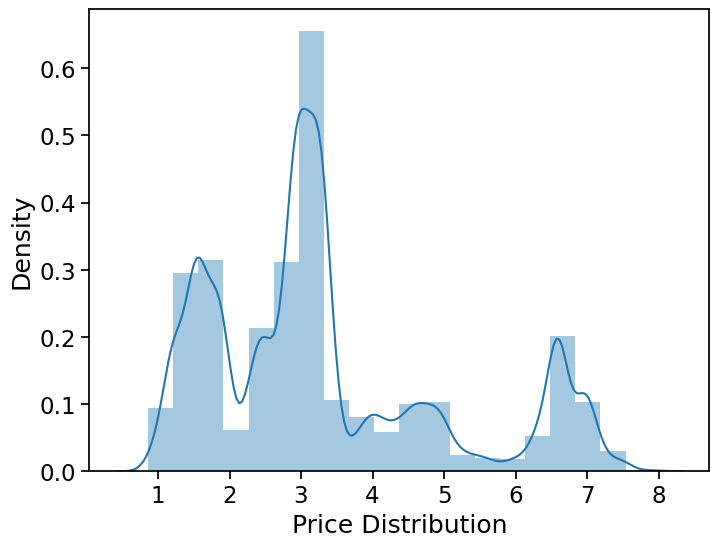

In [34]:
# distribution of tBse price Variable
plt.figure(figsize=(8,6))
sns.distplot((train["BASE_PRICE"].values),bins=20,kde=True)
plt.xlabel("Price Distribution")
plt.show()

- No Extreme values in the base price
- Range for base price 1 dollar to 8 dollar

#### FEATURE and DISPLAY

In [35]:
train[["FEATURE","DISPLAY"]].isnull().sum()

FEATURE    0
DISPLAY    0
dtype: int64

In [36]:
train[["FEATURE","DISPLAY"]].dtypes

FEATURE    int64
DISPLAY    int64
dtype: object

In [37]:
train["FEATURE"].value_counts(normalize=True)*100

FEATURE
0    90.011064
1     9.988936
Name: proportion, dtype: float64

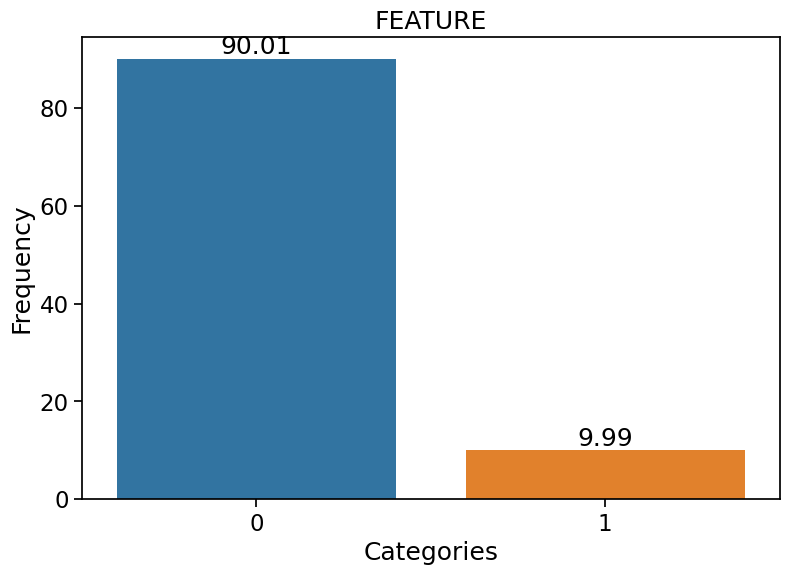

In [38]:
plt.figure(figsize=(9,6))
sns.barplot(x=train["FEATURE"].value_counts().index, y=train["FEATURE"].value_counts(normalize=True)*100)
for i, value in enumerate(train["FEATURE"].value_counts(normalize=True)*100):
    plt.text(i, value, f'{value:.2f}', ha='center', va='bottom')

plt.xlabel('Categories')
plt.ylabel('Frequency')
plt.title('FEATURE')

plt.show()

- Approximately 10 percent of product are featured

In [39]:
train["DISPLAY"].value_counts(normalize=True)*100

DISPLAY
0    86.49989
1    13.50011
Name: proportion, dtype: float64

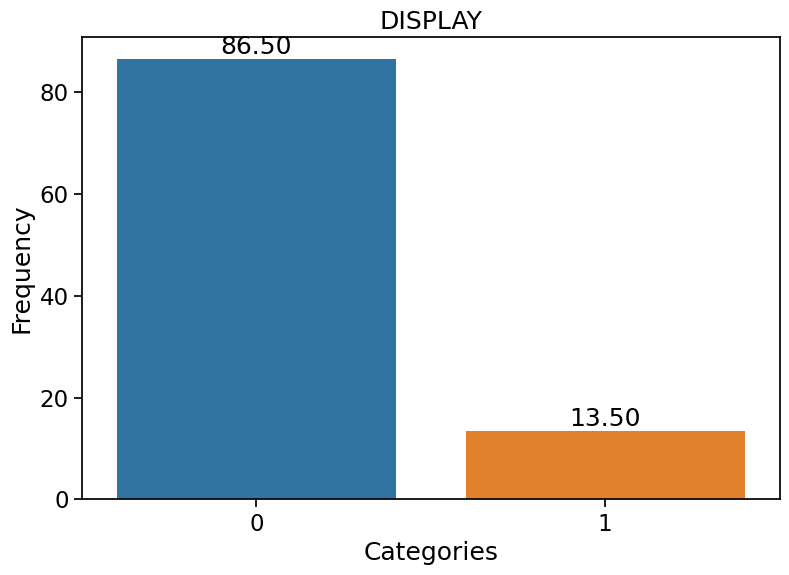

In [40]:
plt.figure(figsize=(9,6))
sns.barplot(x=train["DISPLAY"].value_counts().index, y=train["DISPLAY"].value_counts(normalize=True)*100)
for i, value in enumerate(train["DISPLAY"].value_counts(normalize=True)*100):
    plt.text(i, value, f'{value:.2f}', ha='center', va='bottom')

plt.xlabel('Categories')
plt.ylabel('Frequency')
plt.title('DISPLAY')

plt.show()

- About 13% of products are on display

In [41]:
pd.crosstab(train["FEATURE"],train["DISPLAY"])

DISPLAY,0,1
FEATURE,,
0,190899,18185
1,10029,13174


In [42]:
pd.crosstab(train["FEATURE"],train["DISPLAY"]).apply(lambda r: r/len(train))

DISPLAY,0,1
FEATURE,,
0,0.821824,0.078287
1,0.043175,0.056714


### UNITS

In [43]:
train["UNITS"].isnull().sum()

0

In [44]:
train["UNITS"].describe()

count    232287.000000
mean         28.063525
std          35.954341
min           0.000000
25%           9.000000
50%          18.000000
75%          34.000000
max        1800.000000
Name: UNITS, dtype: float64

- The Range of values is very high
- Minimum number of units sold is 0 and maximum is 1800
- A huge difference between the 75th percentile and the max value indicates presence of outliers

#### How many rows in the data have 0 units sold?
#### Is there only one row with such high sales of 1800? 

In [45]:
train[train["UNITS"]==0]

,WEEK_END_DATE,STORE_NUM,UPC,PRICE,BASE_PRICE,FEATURE,DISPLAY,UNITS
76752,2009-12-02,28909,31254742735,NaN,4.99,0,0,0


- Only one entry with 0 items sold
- Indicates the given store does not sell the following item
- It's simply a Data Anomaly and will not be useful in model training

In [46]:
train=train[train["UNITS"]!=0]

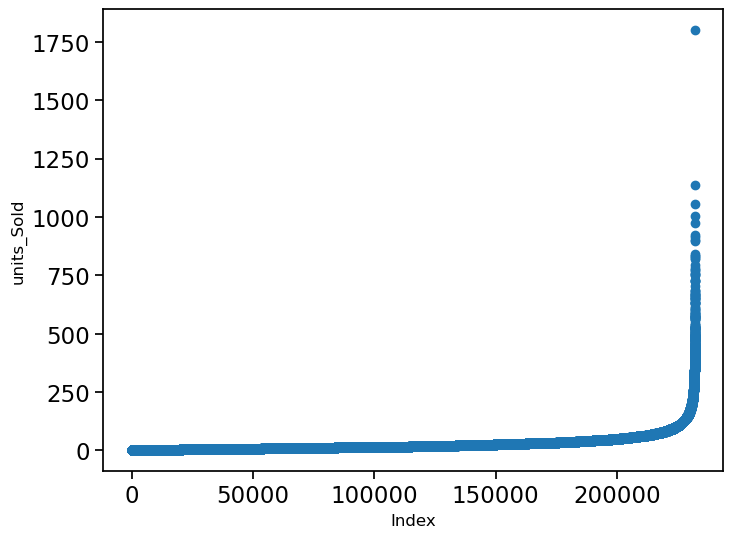

In [47]:
# Scatter plot for UNITS Variable
plt.figure(figsize=(8,6))
plt.scatter(x=range(train.shape[0]),y=np.sort(train["UNITS"].values))
plt.xlabel("Index",fontsize=12)
plt.ylabel("units_Sold",fontsize=12)
plt.show()

- Most of the values are less than 250 
- There are a few outliers (with 1 outlier way outside the range)

In [48]:
train[train["UNITS"] > 1000]

,WEEK_END_DATE,STORE_NUM,UPC,PRICE,BASE_PRICE,FEATURE,DISPLAY,UNITS
7893,2009-02-11,24991,1600027527,1.67,3.19,1,0,1006
7960,2009-02-11,25027,1600027527,1.64,3.19,1,1,1800
9597,2009-02-18,25027,1600027527,1.60,3.19,0,1,1054
11209,2009-02-25,25027,1600027527,1.64,3.19,1,1,1136


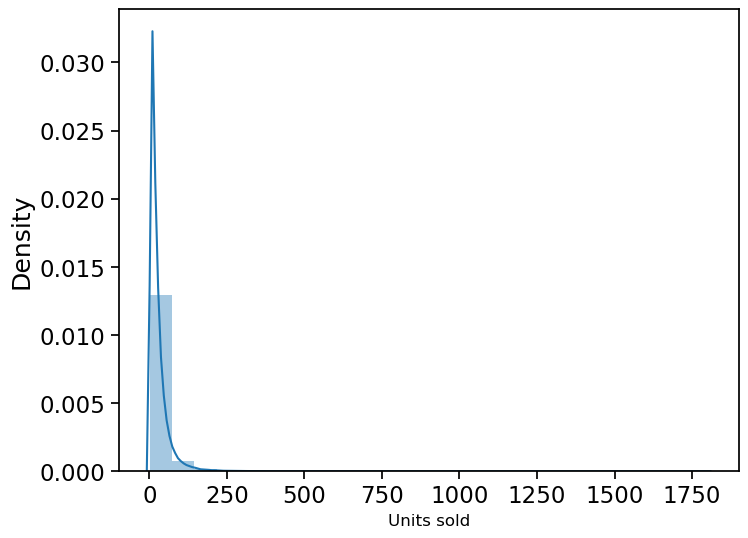

In [49]:
# Distribution of Units Variable
plt.figure(figsize=(8,6))
sns.distplot((train["UNITS"].values),bins=25,kde=True)
plt.xlabel("Units sold",fontsize=12)
plt.show()

##### When observing the above the graph it not normally distributed , it is looks like the  right skwed of the data we can transform the UNITS column
- 1.when right skwed distribution we can use log transformation
- 2.when left skewed ditribution we can use the exponential tranformation

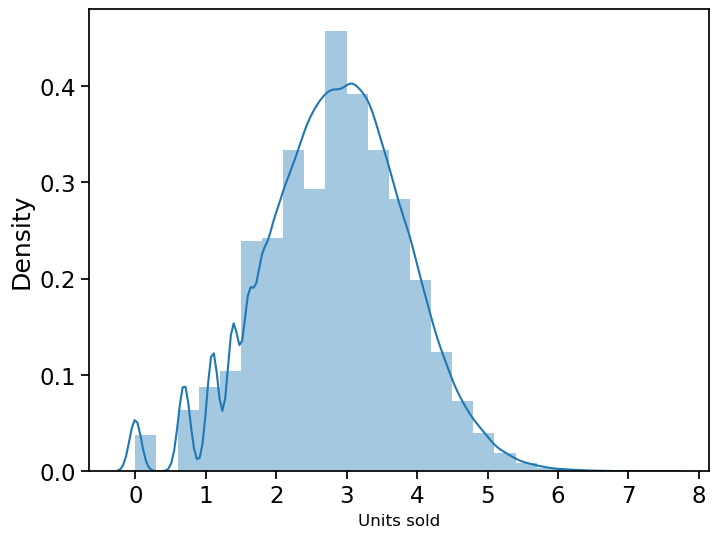

In [50]:
# log Transformation of the UNITS Column
plt.figure(figsize=(8,6))
sns.distplot(np.log(train["UNITS"].values),bins=25,kde=True)
plt.xlabel("Units sold",fontsize=12)
plt.show()

- After log transformation, the distribution looks closer to a normal distribution

## Understading the Product Data

In [51]:
#First five rows of product data
product_data.head()

,UPC,DESCRIPTION,MANUFACTURER,CATEGORY,SUB_CATEGORY,PRODUCT_SIZE
0,1111009477,PL MINI TWIST PRETZELS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ
1,1111009497,PL PRETZEL STICKS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ
2,1111009507,PL TWIST PRETZELS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ
3,1111038078,PL BL MINT ANTSPTC RINSE,PRIVATE LABEL,ORAL HYGIENE PRODUCTS,MOUTHWASHES (ANTISEPTIC),500 ML
4,1111038080,PL ANTSPTC SPG MNT MTHWS,PRIVATE LABEL,ORAL HYGIENE PRODUCTS,MOUTHWASHES (ANTISEPTIC),500 ML


In [52]:
#Checking the data types
product_data.dtypes

UPC              int64
DESCRIPTION     object
MANUFACTURER    object
CATEGORY        object
SUB_CATEGORY    object
PRODUCT_SIZE    object
dtype: object

#### Categorical Variables

- Check the unique values for categorical variables
- Are there any missing values in the variables?
- Is there any variable with high cardinality/ sparsity?

In [53]:
product_data["UPC"].nunique()

30

- The number is consistent through the train and product data.

##### Are all the product codes exactly the same?

In [54]:
len(set(product_data.UPC).intersection(set(train.UPC)))

30

In [55]:
#number and list of unique categories in the product data
product_data["CATEGORY"].nunique(),product_data["CATEGORY"].unique()

(4,
 array(['BAG SNACKS', 'ORAL HYGIENE PRODUCTS', 'COLD CEREAL',
        'FROZEN PIZZA'], dtype=object))

In [56]:
product_data["CATEGORY"].isnull().sum()

0

In [57]:
product_data["CATEGORY"].value_counts()

CATEGORY
COLD CEREAL              9
BAG SNACKS               8
FROZEN PIZZA             7
ORAL HYGIENE PRODUCTS    6
Name: count, dtype: int64

- We have four product categories - 
  *  BAG SNACKS
  *  ORAL HYGIENE PRODUCTS 
  *  COLD CEREAL 
  *  FROZEN PIZZA

- There are 9 products with the category 'Cold Cereal'
- Similarly, 8 products labeled 'Bag snacks', 7 with category 'Frozen Pizza' and 6 'Oral Hygiene' Products

#### Is there any subdivision among the product categories?

##### SUB_CATEGORY

In [58]:
product_data["SUB_CATEGORY"].isnull().sum()

0

In [59]:
product_data["SUB_CATEGORY"].nunique()

7

In [60]:
product_data["SUB_CATEGORY"].nunique(),product_data["SUB_CATEGORY"].unique()

(7,
 array(['PRETZELS', 'MOUTHWASHES (ANTISEPTIC)', 'ALL FAMILY CEREAL',
        'ADULT CEREAL', 'PIZZA/PREMIUM', 'MOUTHWASH/RINSES AND SPRAYS',
        'KIDS CEREAL'], dtype=object))

In [61]:
product_data["CATEGORY"].nunique(),product_data["CATEGORY"].unique()

(4,
 array(['BAG SNACKS', 'ORAL HYGIENE PRODUCTS', 'COLD CEREAL',
        'FROZEN PIZZA'], dtype=object))

In [62]:
#display subcategories aginst each category
product_data[["CATEGORY","SUB_CATEGORY"]].drop_duplicates().sort_values(by="CATEGORY")

,CATEGORY,SUB_CATEGORY
0,BAG SNACKS,PRETZELS
5,COLD CEREAL,ALL FAMILY CEREAL
6,COLD CEREAL,ADULT CEREAL
19,COLD CEREAL,KIDS CEREAL
8,FROZEN PIZZA,PIZZA/PREMIUM
3,ORAL HYGIENE PRODUCTS,MOUTHWASHES (ANTISEPTIC)
16,ORAL HYGIENE PRODUCTS,MOUTHWASH/RINSES AND SPRAYS


The sub-categories give additional detail about the product.

- Cereal has 3 sub categories, differentiating on the age group 
- Oral hygiene products have 2 sub categories, antiseptic and rinse/spray
- Bag Snacks & Frozen Pizza have just 1 sub category, no further division



In [63]:
#unique Category, Sub_category and product size Combination
product_data[["CATEGORY","SUB_CATEGORY","PRODUCT_SIZE"]].drop_duplicates().sort_values(by="CATEGORY")

,CATEGORY,SUB_CATEGORY,PRODUCT_SIZE
0,BAG SNACKS,PRETZELS,15 OZ
14,BAG SNACKS,PRETZELS,16 OZ
25,BAG SNACKS,PRETZELS,10 OZ
6,COLD CEREAL,ADULT CEREAL,20 OZ
7,COLD CEREAL,ALL FAMILY CEREAL,18 OZ
19,COLD CEREAL,KIDS CEREAL,15 OZ
20,COLD CEREAL,KIDS CEREAL,12.2 OZ
5,COLD CEREAL,ALL FAMILY CEREAL,12.25 OZ
13,COLD CEREAL,ALL FAMILY CEREAL,12 OZ
8,FROZEN PIZZA,PIZZA/PREMIUM,32.7 OZ


The cold cereal for kids is available in two different sizes.\
Also, the cold cereal for all family has the same size as the cold cereal for kids.\
Hence subcategory is not an indicator of size.

**To summarize**
- Bag Snacks has 1 sub category and 3 product size available
- Oral Hygiene product has 2 sub categories and 2 size options
- Frozen Pizza has only 1 sub category and 6 different package size
- cold ceral has 3 sub categoeies, and 6 options in size

In [64]:
product_data["DESCRIPTION"].isnull().sum()

0

In [65]:
product_data["DESCRIPTION"].nunique(),product_data["DESCRIPTION"].unique()

(29,
 array(['PL MINI TWIST PRETZELS', 'PL PRETZEL STICKS', 'PL TWIST PRETZELS',
        'PL BL MINT ANTSPTC RINSE', 'PL ANTSPTC SPG MNT MTHWS',
        'PL HONEY NUT TOASTD OATS', 'PL RAISIN BRAN',
        'PL BT SZ FRSTD SHRD WHT', 'PL SR CRUST SUPRM PIZZA',
        'PL SR CRUST 3 MEAT PIZZA', 'PL SR CRUST PEPPRN PIZZA',
        'GM HONEY NUT CHEERIOS', 'GM CHEERIOS', 'RLDGLD TINY TWISTS PRTZL',
        'RLDGLD PRETZEL STICKS', 'SCOPE ORIG MINT MOUTHWASH',
        'CREST PH CLN MINT RINSE', 'KELL BITE SIZE MINI WHEAT',
        'KELL FROSTED FLAKES', 'KELL FROOT LOOPS', 'DIGIORNO THREE MEAT',
        'DIGRN SUPREME PIZZA', 'DIGRN PEPP PIZZA',
        'FRSC BRCK OVN ITL PEP PZ', 'SNYDR PRETZEL RODS',
        'SNYDR SOURDOUGH NIBBLERS', 'SNYDR FF MINI PRETZELS',
        'LSTRNE CL MINT ANTSPTC MW', 'LSTRNE FRS BRST ANTSPC MW'],
       dtype=object))

- We have 29 descriptions in the dataset, for 30 products.
- Almost all products have a unique description. 

In [66]:
product_data["DESCRIPTION"].value_counts()

DESCRIPTION
GM CHEERIOS                  2
PL MINI TWIST PRETZELS       1
SCOPE ORIG MINT MOUTHWASH    1
LSTRNE CL MINT ANTSPTC MW    1
SNYDR FF MINI PRETZELS       1
SNYDR SOURDOUGH NIBBLERS     1
SNYDR PRETZEL RODS           1
FRSC BRCK OVN ITL PEP PZ     1
DIGRN PEPP PIZZA             1
DIGRN SUPREME PIZZA          1
DIGIORNO THREE MEAT          1
KELL FROOT LOOPS             1
KELL FROSTED FLAKES          1
KELL BITE SIZE MINI WHEAT    1
CREST PH CLN MINT RINSE      1
RLDGLD PRETZEL STICKS        1
PL PRETZEL STICKS            1
RLDGLD TINY TWISTS PRTZL     1
GM HONEY NUT CHEERIOS        1
PL SR CRUST PEPPRN PIZZA     1
PL SR CRUST 3 MEAT PIZZA     1
PL SR CRUST SUPRM PIZZA      1
PL BT SZ FRSTD SHRD WHT      1
PL RAISIN BRAN               1
PL HONEY NUT TOASTD OATS     1
PL ANTSPTC SPG MNT MTHWS     1
PL BL MINT ANTSPTC RINSE     1
PL TWIST PRETZELS            1
LSTRNE FRS BRST ANTSPC MW    1
Name: count, dtype: int64

In [67]:
product_data.loc[product_data["DESCRIPTION"]=="GM CHEERIOS"]

,UPC,DESCRIPTION,MANUFACTURER,CATEGORY,SUB_CATEGORY,PRODUCT_SIZE
12,1600027528,GM CHEERIOS,GENERAL MI,COLD CEREAL,ALL FAMILY CEREAL,18 OZ
13,1600027564,GM CHEERIOS,GENERAL MI,COLD CEREAL,ALL FAMILY CEREAL,12 OZ


__The product `DESCRIPTION` of `GM CHEERIOS` is repeated twice, but with different `product sizes.`__

In [68]:
product_data.loc[product_data["UPC"]==1600027527]

,UPC,DESCRIPTION,MANUFACTURER,CATEGORY,SUB_CATEGORY,PRODUCT_SIZE
11,1600027527,GM HONEY NUT CHEERIOS,GENERAL MI,COLD CEREAL,ALL FAMILY CEREAL,12.25 OZ


- More granular description for the product
- Includes the type of product and manufacturer

### MANUFACTURER

In [70]:
product_data["MANUFACTURER"].value_counts()

MANUFACTURER
PRIVATE LABEL    11
GENERAL MI        3
KELLOGG           3
TOMBSTONE         3
SNYDER S          3
FRITO LAY         2
P & G             2
WARNER            2
TONYS             1
Name: count, dtype: int64

In [71]:
product_data["MANUFACTURER"].isnull().sum()

0

In [72]:
product_data["MANUFACTURER"].nunique()

9

In [73]:
# displaying the list of manufacturers against the 4 categories
temp = product_data[['CATEGORY','MANUFACTURER']].drop_duplicates()
pd.crosstab([temp['CATEGORY']], temp['MANUFACTURER'])

MANUFACTURER,FRITO LAY,GENERAL MI,KELLOGG,P & G,PRIVATE LABEL,SNYDER S,TOMBSTONE,TONYS,WARNER
CATEGORY,,,,,,,,,
BAG SNACKS,1,0,0,0,1,1,0,0,0
COLD CEREAL,0,1,1,0,1,0,0,0,0
FROZEN PIZZA,0,0,0,0,1,0,1,1,0
ORAL HYGIENE PRODUCTS,0,0,0,1,1,0,0,0,1


- We have 4 unique categories of Products
- Each category has three manufacturers
- Every category has a manufacturer 'private label' (and 2 other manufacturers)

### Store data

In [74]:
#First five rows of product data
store_data.head()

,STORE_ID,STORE_NAME,ADDRESS_CITY_NAME,ADDRESS_STATE_PROV_CODE,MSA_CODE,SEG_VALUE_NAME,PARKING_SPACE_QTY,SALES_AREA_SIZE_NUM,AVG_WEEKLY_BASKETS
0,367,15TH & MADISON,COVINGTON,KY,17140,VALUE,196.0,24721,12707
1,389,SILVERLAKE,ERLANGER,KY,17140,MAINSTREAM,408.0,46073,24767
2,613,EAST ALLEN,ALLEN,TX,19100,MAINSTREAM,464.0,64926,29386
3,623,HOUSTON,HOUSTON,TX,26420,MAINSTREAM,NaN,46930,36741
4,2277,ANDERSON TOWNE CTR,CINCINNATI,OH,17140,UPSCALE,NaN,81958,54053


In [75]:
#checking the data types of the given data
store_data.dtypes

STORE_ID                     int64
STORE_NAME                  object
ADDRESS_CITY_NAME           object
ADDRESS_STATE_PROV_CODE     object
MSA_CODE                     int64
SEG_VALUE_NAME              object
PARKING_SPACE_QTY          float64
SALES_AREA_SIZE_NUM          int64
AVG_WEEKLY_BASKETS           int64
dtype: object

#### Numerical Variables

- Check the distribution of numerical variables
- Are there any extreme values?
- Are there any missing values in the variables?

#### Categorical Variables

- Check the unique values for categorical variables
- Are there any missing values in the variables?
- Is there any variable with high cardinality/ sparsity?

In [76]:
store_data["STORE_ID"].nunique()

76

In [77]:
len(set(store_data["STORE_ID"]).intersection(set(train["STORE_NUM"])))

76

#### STORE_NAME

In [78]:
store_data["STORE_NAME"].isnull().sum()

0

- The number of unique store IDs is more than number of unique store names
- There might be stores with same name, located in different city

#### Which store name is being repeated?

#### Why do some stores have same name and different ID?

In [79]:
store_data["STORE_NAME"].value_counts()

STORE_NAME
HOUSTON            4
MIDDLETOWN         2
15TH & MADISON     1
DUNCANVILLE        1
WOOD FOREST S/C    1
                  ..
AT EASTEX FRWY     1
DENT               1
THE WOODLANDS      1
LANDEN             1
CARROLLTON         1
Name: count, Length: 72, dtype: int64

In [80]:
store_data.loc[store_data["STORE_NAME"]=="HOUSTON"]

,STORE_ID,STORE_NAME,ADDRESS_CITY_NAME,ADDRESS_STATE_PROV_CODE,MSA_CODE,SEG_VALUE_NAME,PARKING_SPACE_QTY,SALES_AREA_SIZE_NUM,AVG_WEEKLY_BASKETS
3,623,HOUSTON,HOUSTON,TX,26420,MAINSTREAM,NaN,46930,36741
9,2513,HOUSTON,HOUSTON,TX,26420,UPSCALE,NaN,61833,32423
54,21485,HOUSTON,KATY,TX,26420,MAINSTREAM,NaN,46369,26472
59,23327,HOUSTON,HOUSTON,TX,26420,MAINSTREAM,NaN,50722,30258


In [81]:
store_data.loc[store_data["STORE_NAME"]=="MIDDLETOWN"]

,STORE_ID,STORE_NAME,ADDRESS_CITY_NAME,ADDRESS_STATE_PROV_CODE,MSA_CODE,SEG_VALUE_NAME,PARKING_SPACE_QTY,SALES_AREA_SIZE_NUM,AVG_WEEKLY_BASKETS
50,21221,MIDDLETOWN,MIDDLETOWN,OH,17140,VALUE,NaN,48128,17010
74,28909,MIDDLETOWN,MIDDLETOWN,OH,17140,MAINSTREAM,NaN,85876,28986


In [82]:
store_data["STORE_ID"].value_counts()

STORE_ID
367      1
19533    1
23055    1
21485    1
21479    1
        ..
9825     1
8263     1
8041     1
8035     1
29159    1
Name: count, Length: 76, dtype: int64

In [83]:
store_data[["ADDRESS_CITY_NAME","ADDRESS_STATE_PROV_CODE"]].isnull().sum()

ADDRESS_CITY_NAME          0
ADDRESS_STATE_PROV_CODE    0
dtype: int64

In [84]:
store_data["ADDRESS_STATE_PROV_CODE"].unique()

array(['KY', 'TX', 'OH', 'IN'], dtype=object)

In [85]:
store_data["ADDRESS_CITY_NAME"].unique()

array(['COVINGTON', 'ERLANGER', 'ALLEN', 'HOUSTON', 'CINCINNATI',
       'MILFORD', 'BLUE ASH', 'CLUTE', 'DICKINSON', 'GRAND PRAIRIE',
       'ARLINGTON', 'LAWRENCEBURG', 'SUGAR LAND', 'ROCKWALL',
       'COLLEGE STATION', 'MASON', 'SAINT MARYS', 'KINGWOOD', 'BAYTOWN',
       'MAINEVILLE', 'THE WOODLANDS', 'INDEPENDENCE', 'LOVELAND',
       'DALLAS', 'SHERMAN', 'VANDALIA', 'BEAUMONT', 'MAGNOLIA',
       'RICHARDSON', 'MCKINNEY', 'GOSHEN', 'PASADENA', 'WOODLANDS',
       'MESQUITE', 'FLOWER MOUND', 'SOUTHLAKE', 'DUNCANVILLE', 'DENTON',
       'MIDDLETOWN', 'LEBANON', 'KATY', 'HAMILTON', 'KETTERING',
       'WEST CHESTER', 'FRISCO', 'GARLAND', 'DAYTON', 'CYPRESS',
       'CROWLEY', 'SPRINGFIELD', 'CARROLLTON'], dtype=object)

In [86]:
store_data[["ADDRESS_CITY_NAME","ADDRESS_STATE_PROV_CODE"]].nunique()

ADDRESS_CITY_NAME          51
ADDRESS_STATE_PROV_CODE     4
dtype: int64

In [87]:
store_data.groupby(["ADDRESS_STATE_PROV_CODE"])["STORE_ID"].count()

ADDRESS_STATE_PROV_CODE
IN     1
KY     4
OH    30
TX    41
Name: STORE_ID, dtype: int64

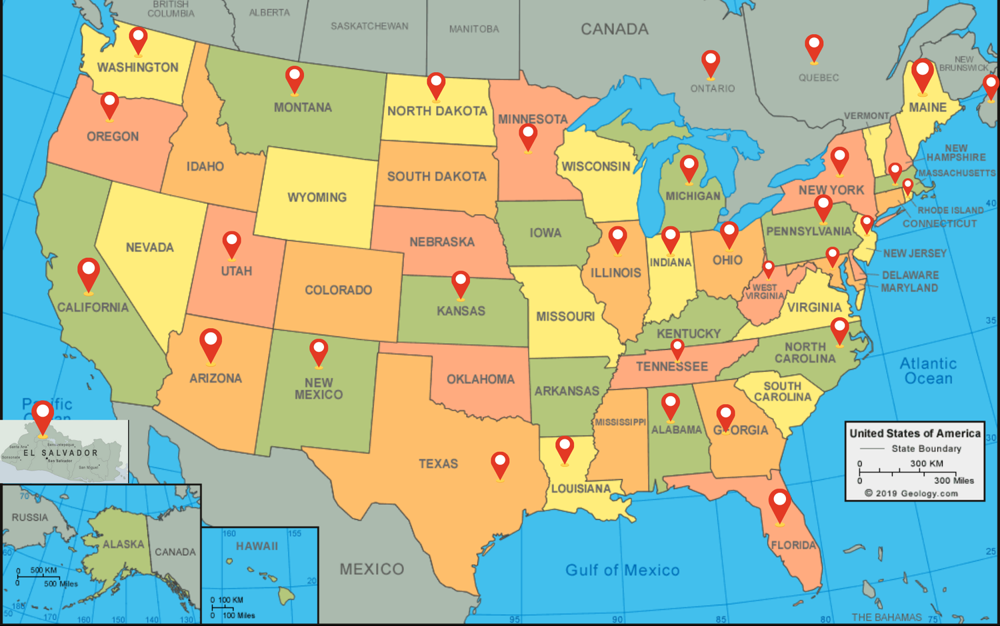

- Each store has a unique store ID 
- Most stores are from Ohio and Texas ~93%
- Few from Kentucky and Indiana ~7%

In [88]:
store_data.groupby(["ADDRESS_STATE_PROV_CODE"])["ADDRESS_CITY_NAME"].nunique()

ADDRESS_STATE_PROV_CODE
IN     1
KY     3
OH    16
TX    31
Name: ADDRESS_CITY_NAME, dtype: int64

In [89]:
store_data["ADDRESS_CITY_NAME"].value_counts()

ADDRESS_CITY_NAME
CINCINNATI         9
HOUSTON            8
MIDDLETOWN         3
COVINGTON          2
SUGAR LAND         2
LOVELAND           2
MAINEVILLE         2
HAMILTON           2
KATY               2
MCKINNEY           2
DAYTON             2
CROWLEY            1
GOSHEN             1
PASADENA           1
WOODLANDS          1
MESQUITE           1
SPRINGFIELD        1
FLOWER MOUND       1
SOUTHLAKE          1
FRISCO             1
WEST CHESTER       1
DENTON             1
CYPRESS            1
LEBANON            1
RICHARDSON         1
GARLAND            1
KETTERING          1
DUNCANVILLE        1
VANDALIA           1
MAGNOLIA           1
BEAUMONT           1
ALLEN              1
MILFORD            1
BLUE ASH           1
CLUTE              1
DICKINSON          1
GRAND PRAIRIE      1
ARLINGTON          1
LAWRENCEBURG       1
ROCKWALL           1
COLLEGE STATION    1
MASON              1
SAINT MARYS        1
KINGWOOD           1
BAYTOWN            1
THE WOODLANDS      1
INDEPENDENCE    

### MSA_CODE

In [90]:
store_data["MSA_CODE"].isnull().sum()

0

In [91]:
store_data["MSA_CODE"].nunique(),store_data["MSA_CODE"].unique()

(9,
 array([17140, 19100, 26420, 17780, 47540, 43300, 19380, 13140, 44220],
       dtype=int64))

In [92]:
(store_data.groupby(["MSA_CODE","ADDRESS_STATE_PROV_CODE"])["STORE_ID"].count())

MSA_CODE  ADDRESS_STATE_PROV_CODE
13140     TX                          1
17140     IN                          1
          KY                          4
          OH                         24
17780     TX                          1
19100     TX                         17
19380     OH                          4
26420     TX                         21
43300     TX                          1
44220     OH                          1
47540     OH                          1
Name: STORE_ID, dtype: int64

- These codes are assigned based on the geographical location and population density. 
- 17140 is present in all three except Texas (which has a different geographical region)

##### PARKING_SPACE_QTY and SALES_AREA_SIZE_NUM

In [93]:
store_data[["PARKING_SPACE_QTY","SALES_AREA_SIZE_NUM"]].isnull().sum()

PARKING_SPACE_QTY      51
SALES_AREA_SIZE_NUM     0
dtype: int64

- Of 76 stores, parking area of 51 is missing

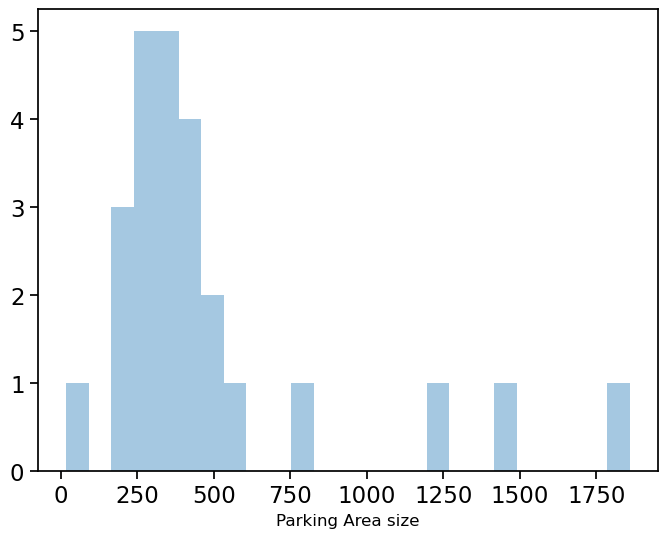

In [94]:
#Vizuliing the PARKING_SPACE_QTY
plt.figure(figsize=(8,6))
sns.distplot(store_data["PARKING_SPACE_QTY"],bins=25,kde=False)
plt.xlabel("Parking Area size",fontsize=12)
plt.show()

- About 15 stores have parking area between 250 - 500 units

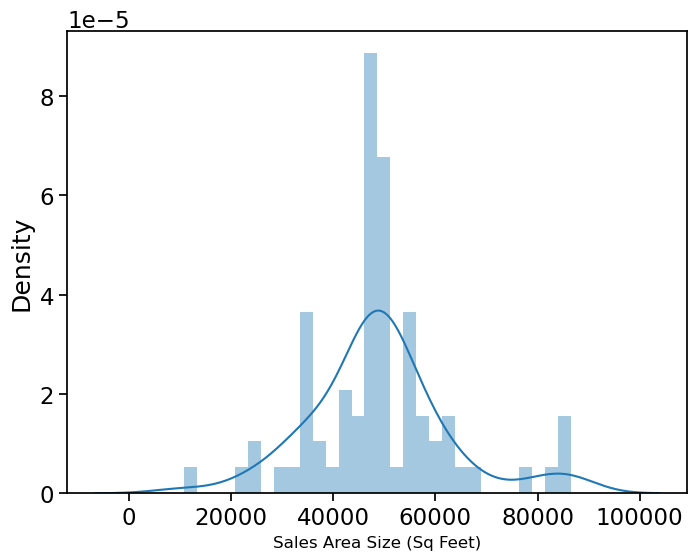

In [95]:
#vizulizing the Store SALES_AREA_SIZE_NUM
plt.figure(figsize=(8,6))
sns.distplot(store_data["SALES_AREA_SIZE_NUM"],bins=30,kde=True)
plt.xlabel("Sales Area Size (Sq Feet)",fontsize=12)
plt.show()

- Most stores have the area between 30-70 K
- Only a small number of stores have area less than 30k or greater than 90k

#### How is Average store size varying for different states?

In [96]:
(store_data.groupby(['ADDRESS_STATE_PROV_CODE'])['SALES_AREA_SIZE_NUM'].mean()).sort_values(ascending=False)

ADDRESS_STATE_PROV_CODE
IN    58563.000000
OH    52691.200000
TX    46920.902439
KY    39855.500000
Name: SALES_AREA_SIZE_NUM, dtype: float64

<Axes: xlabel='SALES_AREA_SIZE_NUM', ylabel='Density'>

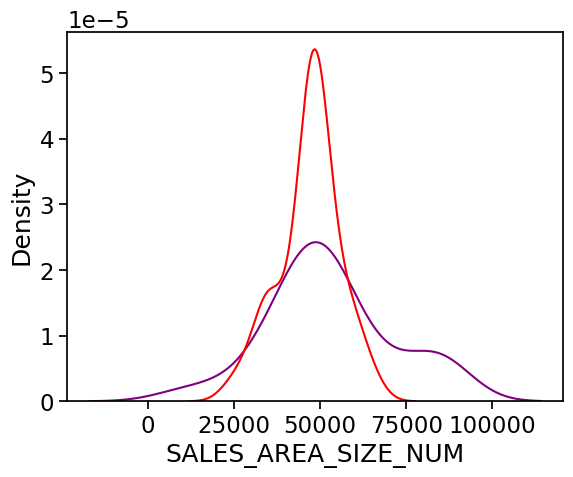

In [97]:
State_oh = store_data.loc[store_data["ADDRESS_STATE_PROV_CODE"] == "OH"]
State_tx = store_data.loc[store_data["ADDRESS_STATE_PROV_CODE"] == "TX"]

sns.distplot(State_oh["SALES_AREA_SIZE_NUM"],hist=False,color="purple",label="OHIO")
sns.distplot(State_tx["SALES_AREA_SIZE_NUM"],hist=False,color="red",label="TEXAS")

- Indiana has only one store and the area size is 58,563 sq feet. 
- Ohio and Texas have average around 52k and 50k. 
- Ohio has stores distributed at all sizes.
- Texas mainly has stores between sales area 30k to 60k 

##### AVG_WEEKLY_BASKETS

In [98]:
store_data["AVG_WEEKLY_BASKETS"].isnull().sum()

0

In [99]:
store_data["AVG_WEEKLY_BASKETS"].describe()

count       76.000000
mean     24226.921053
std       8863.939362
min      10435.000000
25%      16983.500000
50%      24667.500000
75%      29398.500000
max      54053.000000
Name: AVG_WEEKLY_BASKETS, dtype: float64

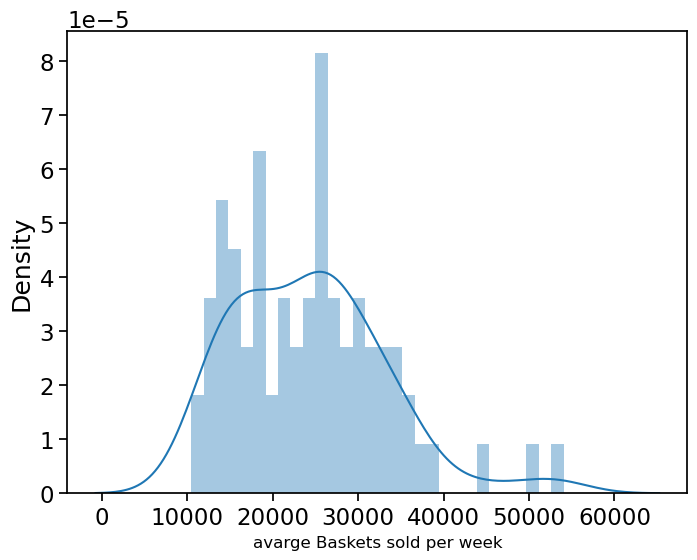

In [100]:
#Vizulizg the AVG_WEEKLY_BASKETS
plt.figure(figsize=(8,6))
sns.distplot(store_data["AVG_WEEKLY_BASKETS"],bins=30,kde=True)
plt.xlabel("avarge Baskets sold per week",fontsize = 12)
plt.show()

- The maximum number of AVG_WEEKLY_BASKETS sold is 54,053, while the minimum is 10,435.

#### What are the average weekly baskets sold for the states? 

In [101]:
(store_data.groupby(["ADDRESS_STATE_PROV_CODE"])["AVG_WEEKLY_BASKETS"].mean()).sort_values(ascending=False)

ADDRESS_STATE_PROV_CODE
OH    26113.766667
TX    23234.195122
KY    21489.000000
IN    19275.000000
Name: AVG_WEEKLY_BASKETS, dtype: float64

- In sales, Ohio leads with around 26,100 units, followed by Texas at roughly 23,200 units, while Kentucky and Indiana trail with about 21,500 and 19,300 units respectively.

##### SEG_VALUE_NAME

In [102]:
store_data["SEG_VALUE_NAME"].isnull().sum()

0

Let us look at the distribution of stores in each of these segments

In [103]:
store_data["SEG_VALUE_NAME"].value_counts(ascending=True)

SEG_VALUE_NAME
UPSCALE       14
VALUE         19
MAINSTREAM    43
Name: count, dtype: int64

There are certain segments assigned to store, based on the brand and quality of products sold at the store.

- **Upscale stores** : Located in high income neighborhoods and offer more high-end product
- **Mainstream stores** : Located in middle class areas, offering a mix of upscale and value product
- **Value stores** : Focus on low prices products targeting low income customers

#### Does the segment has any relation with the store area?



#### Is there a difference in the average sales for each segment?

In [104]:
(store_data.groupby(['SEG_VALUE_NAME'])['SALES_AREA_SIZE_NUM'].mean()).sort_values(ascending=False)

SEG_VALUE_NAME
UPSCALE       59556.428571
MAINSTREAM    50075.976744
VALUE         38706.368421
Name: SALES_AREA_SIZE_NUM, dtype: float64

In [105]:
(store_data.groupby(['SEG_VALUE_NAME'])['AVG_WEEKLY_BASKETS'].mean()).sort_values(ascending=False)

SEG_VALUE_NAME
UPSCALE       28735.928571
MAINSTREAM    24024.093023
VALUE         21363.526316
Name: AVG_WEEKLY_BASKETS, dtype: float64

# 4. Data Exploration - Train, Product, Store

## Validating the Hypothesis

During the Hypothesis Generation, we listed down the following hypothesis. 

**Product Data**
- Product type/ Category : Different Product Categories can have significantly varying trends/patterns
- Product Size : Larger products should be more in demand 
- Price of Product: Same category products with lower price would have more sales
- Company/ Manufacturer: Well known brands/manufacturers will have higher sales

**Train Data**

- Offer Applicable: Featured Products with attractive offers will have higher sales
- Product Promotion: Sales will be more for products with in-store promotion

**Store Data**
- Store Location: Stores in a particular state/city will have a similar trend
- Size of Store: Stores with larger area would have more sales
- Average Wait time: If average baskets sold is higher, wait time would be low. Implies higher sale of units. 

### Merging the train and Product Dataset

In [106]:
train_product_data = train.merge (product_data, how = "left", on = "UPC")

### Merging the Store and train_Product Datasets

In [107]:
final_data = train_product_data.merge(store_data, how = 'left', left_on = 'STORE_NUM', right_on = 'STORE_ID')

In [108]:
final_data.shape

(232286, 22)

## We combine the Three Tables

In [109]:
final_data.columns

Index(['WEEK_END_DATE', 'STORE_NUM', 'UPC', 'PRICE', 'BASE_PRICE', 'FEATURE',
       'DISPLAY', 'UNITS', 'DESCRIPTION', 'MANUFACTURER', 'CATEGORY',
       'SUB_CATEGORY', 'PRODUCT_SIZE', 'STORE_ID', 'STORE_NAME',
       'ADDRESS_CITY_NAME', 'ADDRESS_STATE_PROV_CODE', 'MSA_CODE',
       'SEG_VALUE_NAME', 'PARKING_SPACE_QTY', 'SALES_AREA_SIZE_NUM',
       'AVG_WEEKLY_BASKETS'],
      dtype='object')

<Axes: xlabel='WEEK_END_DATE', ylabel='UNITS'>

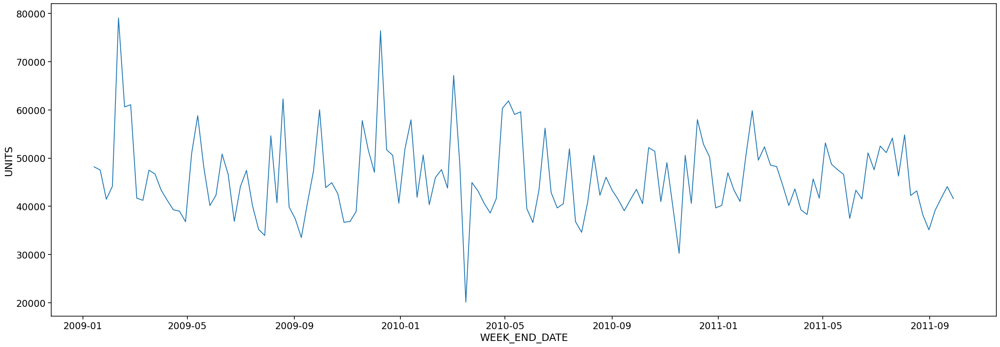

In [110]:
#sum of units Sold per week
weekly_demand = final_data.groupby(["WEEK_END_DATE"])["UNITS"].sum()

plt.figure(figsize=(30,10))
sns.lineplot(x=weekly_demand.index,y=weekly_demand)

- Displays the total number of units sold by the retailer (including all products and from all stores)
- The highest number is close to 80,000 and lowest is close to 20,000 units
- There is no evident pattern or trend in the plot
- The spikes can be seen in either direction and at no constant interval

### Units sold per week - at product level

Now, we will look at category wise sales or demand patterns to see if there is any similarity within each category

In [111]:
# function to plot weekly sales of products
def product_plots(product_list):
    
    # dictionary storing UPC and weekly sales
    d = {product: final_data[final_data['UPC'] == product].groupby(['WEEK_END_DATE'])['UNITS'].sum() for product in product_list}
    fig, axs = plt.subplots(len(product_list), 1, figsize = (20, 20), dpi=300)
    j = 0
    
    for product in d.keys():
        # adding manufacturer and descritption in title
        manu = product_data[product_data['UPC'] == product]['MANUFACTURER'].values[0]
        desc = product_data[product_data['UPC'] == product]['DESCRIPTION'].values[0]            
        # creating the plot
        sns.lineplot(x = d[product].index, y = d[product],ax = axs[j]).set_title(str(manu)+str(" ")+str(desc), y=0.75, fontsize = 16)
        j = j+1
    plt.tight_layout()

In [112]:
# creating list of products based on category
pretzels = list(product_data[product_data['CATEGORY'] == 'BAG SNACKS']['UPC'])
frozen_pizza = list(product_data[product_data['CATEGORY'] == 'FROZEN PIZZA']['UPC'])
oral_hygiene = list(product_data[product_data['CATEGORY'] == 'ORAL HYGIENE PRODUCTS']['UPC'])
cold_cereal = list(product_data[product_data['CATEGORY'] == 'COLD CEREAL']['UPC'])

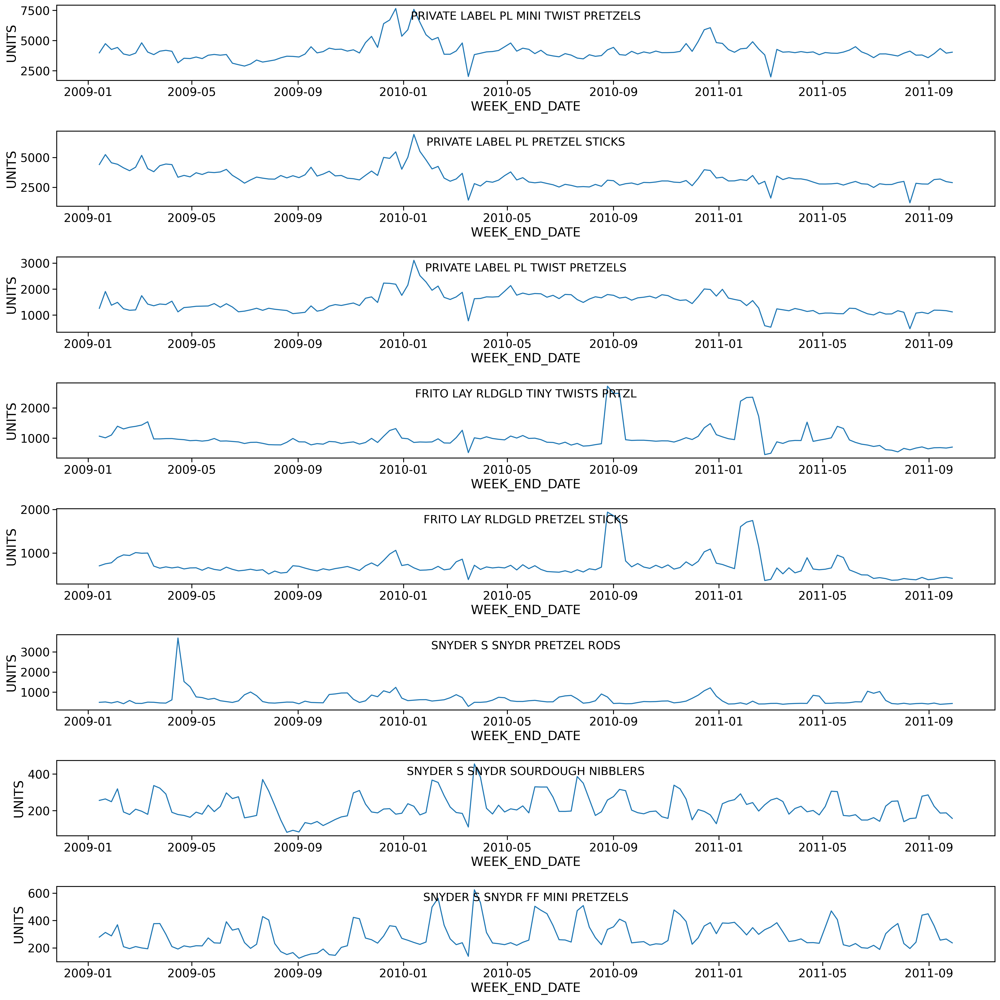

In [113]:
product_plots(pretzels)

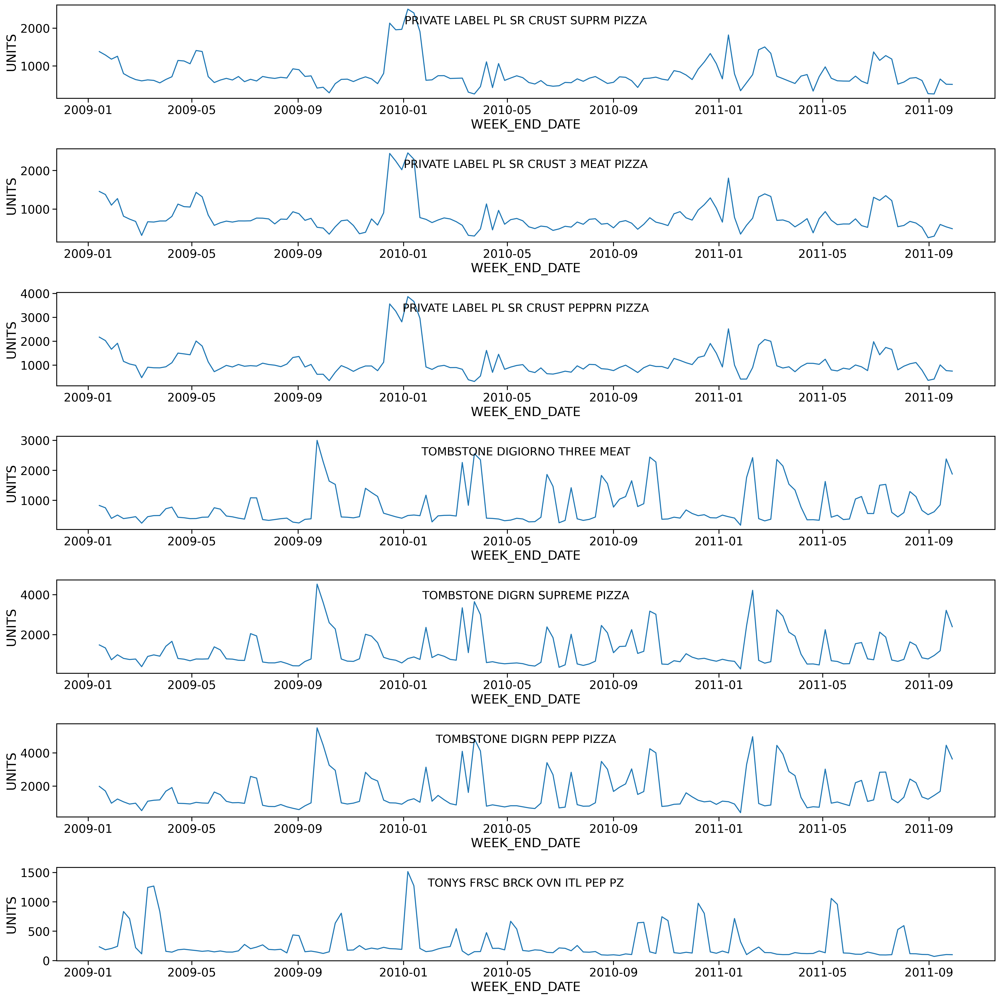

In [114]:
product_plots(frozen_pizza)

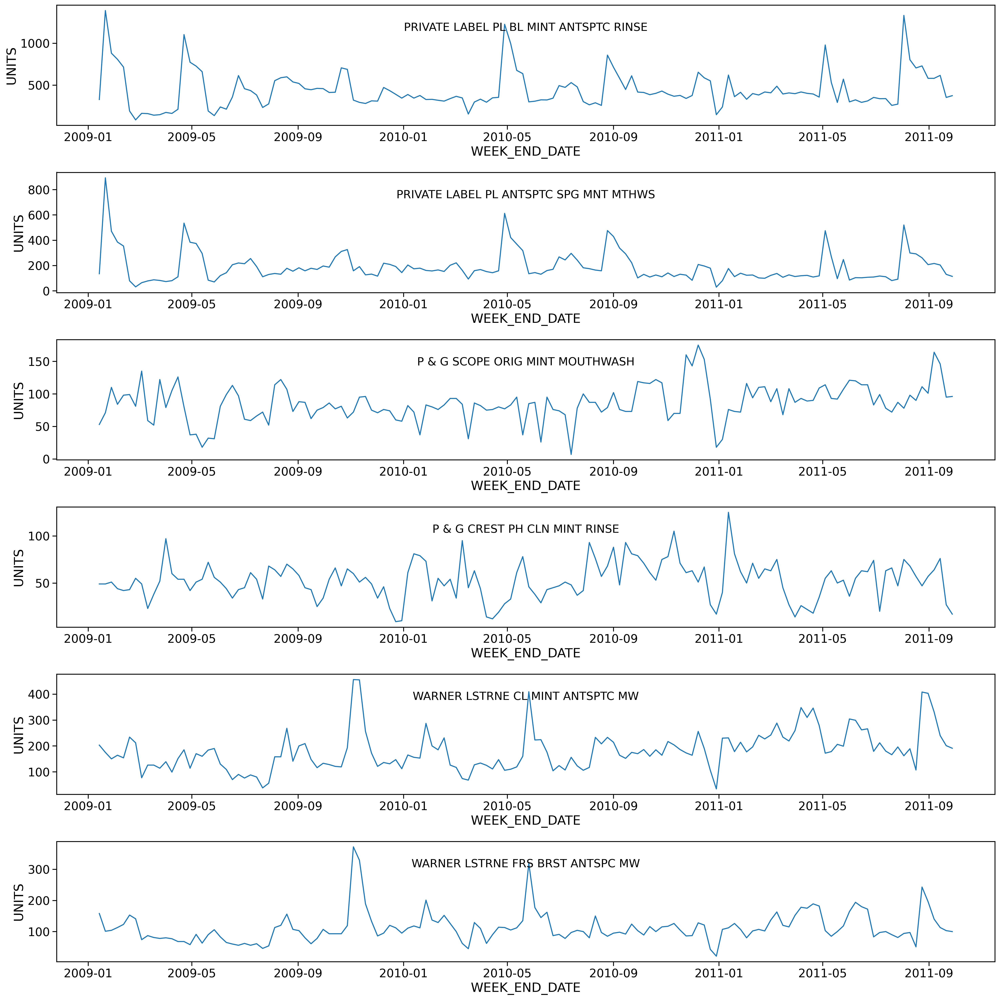

In [115]:
product_plots(oral_hygiene)

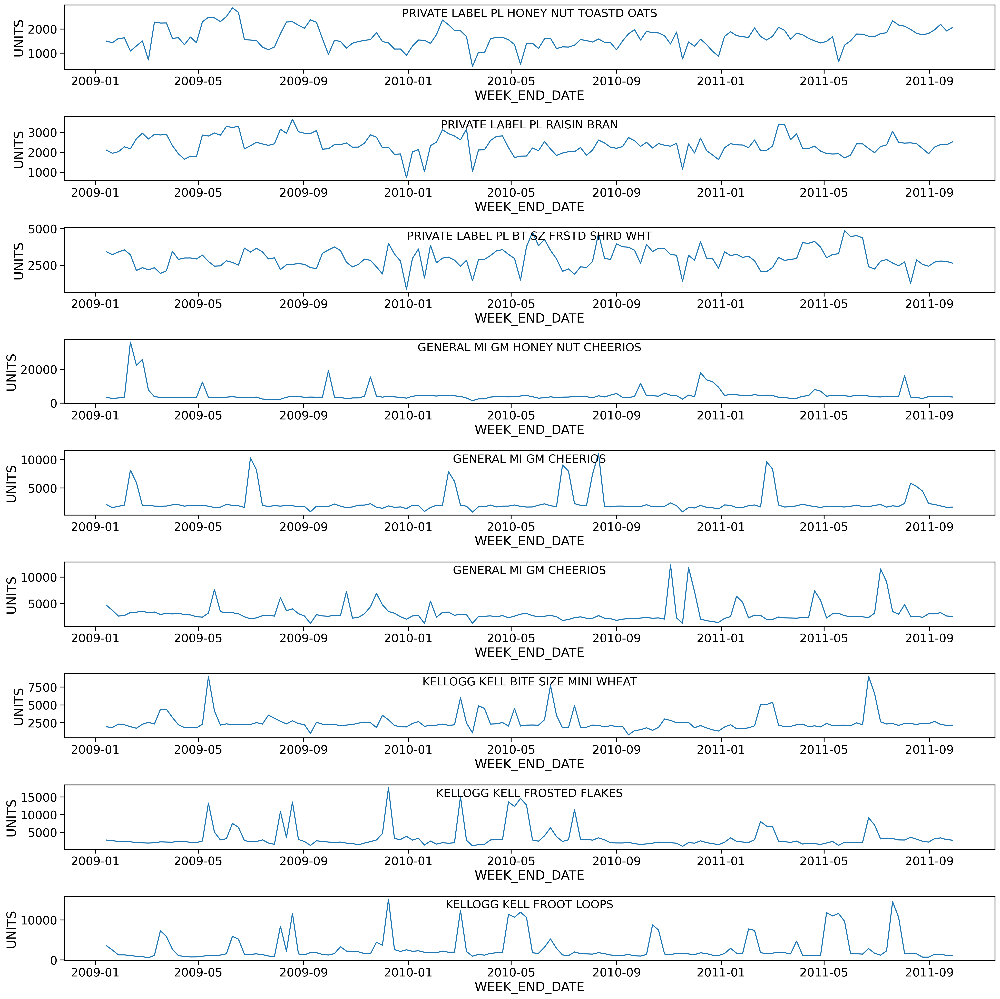

In [116]:
product_plots(cold_cereal)

- No increasing/decreasing trend for the sale of products over time
- No seasonal patterns seen on individual product sale
- Products by same manufaturer have similar patterns (spikes and drops).

### Units sold per week - at store level
Now, let us look store level demand patterns to see if there are any patterns here.

In [117]:
# Randomly selecting 5 store ID
stores_plot = random.sample(list(final_data['STORE_ID']), 5)

In [118]:
#creating dictionary with store number as keys
# for each store, calculate sum of units sold per week
d = {store: train[train['STORE_NUM'] == store].groupby(['WEEK_END_DATE'])['UNITS'].sum() for store in stores_plot}

<Figure size 3000x1000 with 0 Axes>

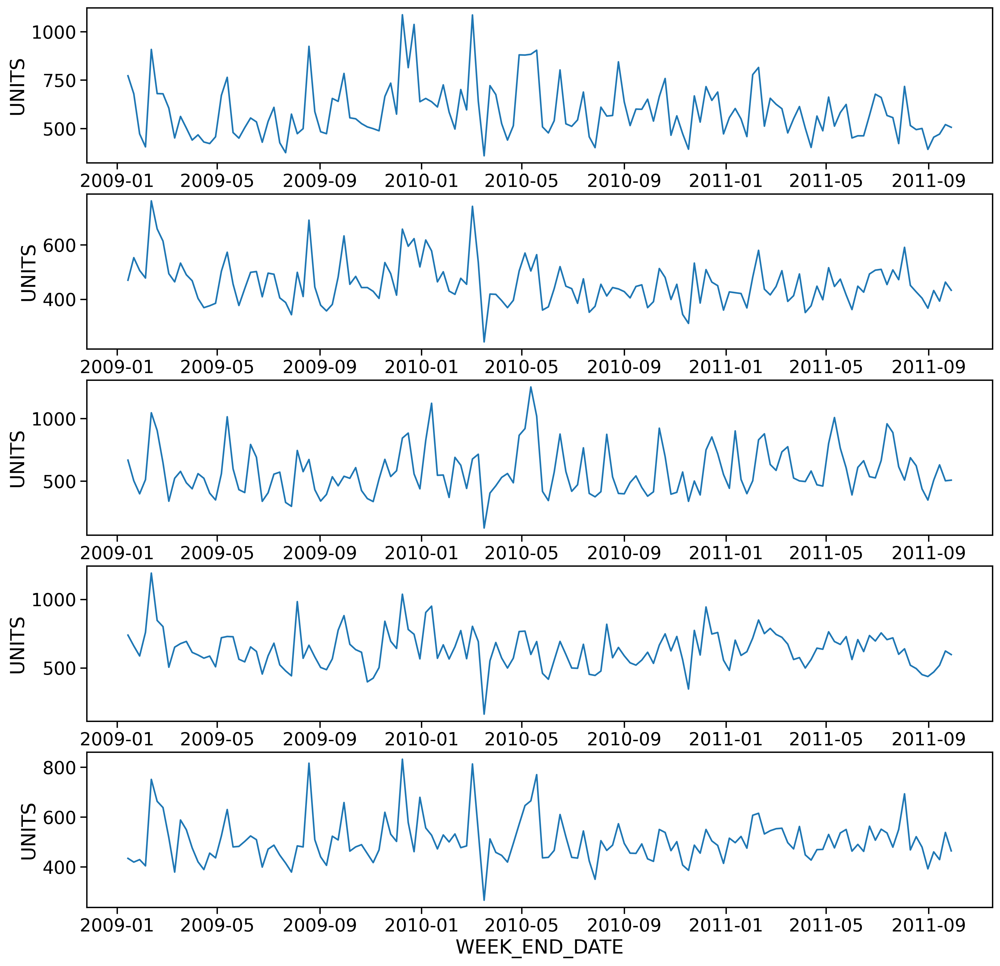

In [119]:
plt.figure(figsize=(30,10))

fig, axs = plt.subplots(5, 1, figsize = (15, 15), dpi=300)
j = 0
for store in d.keys():
    sns.lineplot(x = d[store].index, y = d[store],ax = axs[j])
    j = j+1

For the randomly selected store numbers, we can see that there is no pattern in the plot. The same was repeated for a number of stores and the data showed no increasing or decreasing trend or seasonality. 

### Featured or Displayed Product have higher sale

- Offer Applicable: Featured Products with attractive offers will have higher sales
- Product Promotion: Sales will be more for products with in-store promotion

In [120]:
def featured_plots(product_list):
    #dictionary storing UPC and 'Featured' variable
    d_f = {product: 1000*train[train['UPC'] == product].groupby(['WEEK_END_DATE'])['FEATURE'].mean() for product in product_list}
    #dictionary storing UPC and Product Sales
    d = {product: train[train['UPC'] == product].groupby(['WEEK_END_DATE'])['UNITS'].sum() for product in product_list}
    
    
    fig, axs = plt.subplots(len(product_list), 1, figsize = (20, 20), dpi=300)
    j = 0
    for product in d.keys():
        # Manufacturer name and Descritption in title
        manu = product_data[product_data['UPC'] == product]['MANUFACTURER'].values[0]
        desc = product_data[product_data['UPC'] == product]['DESCRIPTION'].values[0]
        
        # plotting featured and sales values
        sns.lineplot(x = d_f[product].index, y = d_f[product],ax = axs[j]).set_title(str(manu)+str(" ")+str(desc), y=0.75, fontsize = 16)
        sns.lineplot(x = d[product].index, y = d[product],ax = axs[j]).set_title(str(manu)+str(" ")+str(desc), y=0.75, fontsize = 16)
        j = j+1

In [121]:
product_list_f = list(product_data[product_data['CATEGORY'] == 'BAG SNACKS']['UPC'])

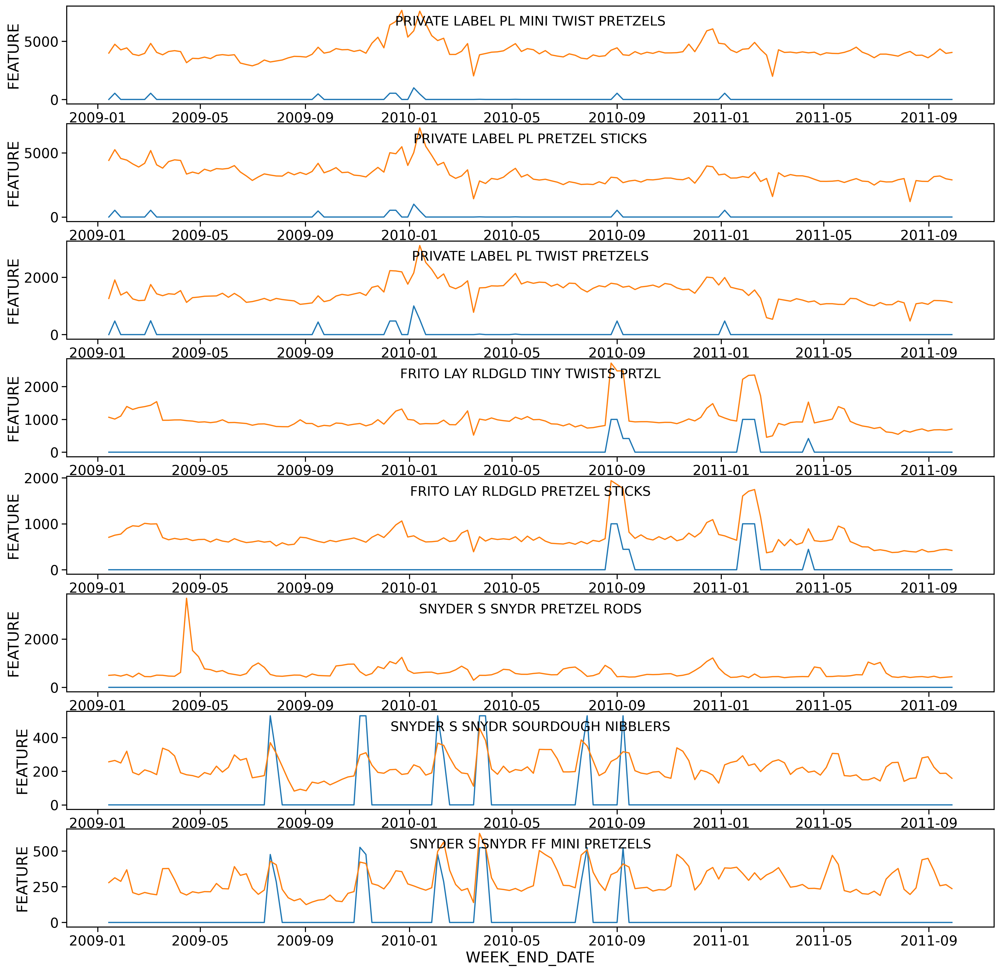

In [122]:
featured_plots(product_list_f)

- When the products are featured, the sales increase.

#### Does the in-store display also have a similar effect?

### Product sales higher for lower priced items

- Price of Product: Same category products with lower price would have more sales


In [123]:
product_size_coldcereal = final_data.loc[final_data['CATEGORY']=='COLD CEREAL']
product_size_bagsnacks  = final_data.loc[final_data['CATEGORY']=='BAG SNACKS']
product_size_frozenpizza = final_data.loc[final_data['CATEGORY']=='FROZEN PIZZA']
product_size_oralhyiegne = final_data.loc[final_data['CATEGORY']=='ORAL HYGIENE PRODUCTS']

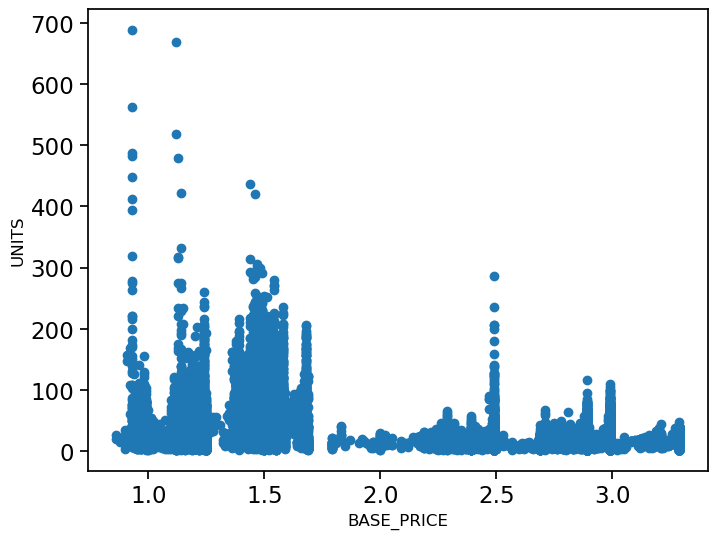

In [124]:
# scatter plot for base price and sales
plt.figure(figsize=(8,6))
plt.scatter(x = (product_size_bagsnacks['BASE_PRICE']), y = (product_size_bagsnacks['UNITS']))
plt.xlabel('BASE_PRICE', fontsize=12)
plt.ylabel('UNITS', fontsize=12)
plt.show()

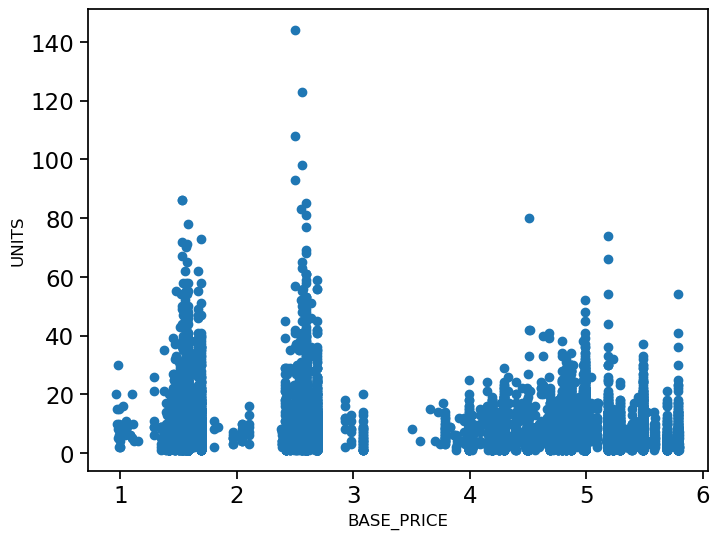

In [125]:
# scatter plot for base price and sales
plt.figure(figsize=(8,6))
plt.scatter(x = (product_size_oralhyiegne['BASE_PRICE']), y = (product_size_oralhyiegne['UNITS']))
plt.xlabel('BASE_PRICE', fontsize=12)
plt.ylabel('UNITS', fontsize=12)
plt.show()

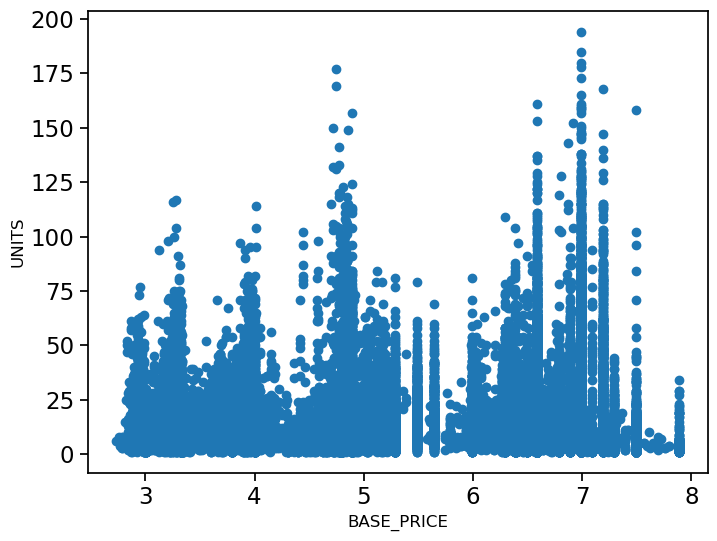

In [126]:
# scatter plot for base price and sales
plt.figure(figsize=(8,6))
plt.scatter(x = (product_size_frozenpizza['BASE_PRICE']), y = (product_size_frozenpizza['UNITS']))
plt.xlabel('BASE_PRICE', fontsize=12)
plt.ylabel('UNITS', fontsize=12)
plt.show()

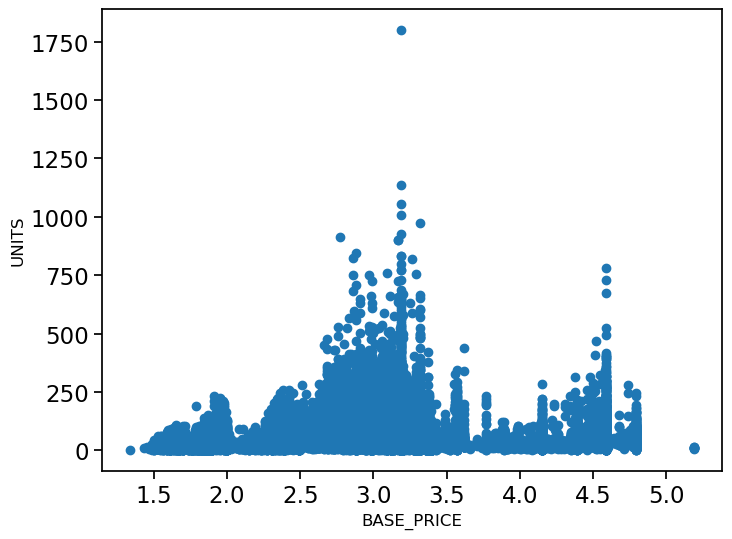

In [127]:
# scatter plot for base price and sales
plt.figure(figsize=(8,6))
plt.scatter(x = (product_size_coldcereal['BASE_PRICE']), y = (product_size_coldcereal['UNITS']))
plt.xlabel('BASE_PRICE', fontsize=12)
plt.ylabel('UNITS', fontsize=12)
plt.show()

- For bag snacks and oral hygiene category, items with lower price show a higher sale. 
- Frozen pizza items have higher sale for higher price items.

Check the pattern for cold cereal at your end.

## Product size versus Product Sales

- Product Size : Larger products should be more in demand 

In [128]:
pd.crosstab(product_size_coldcereal['CATEGORY'], product_size_coldcereal['PRODUCT_SIZE'])

PRODUCT_SIZE,12 OZ,12.2 OZ,12.25 OZ,15 OZ,18 OZ,20 OZ
CATEGORY,,,,,,
COLD CEREAL,10786,10766,21426,10785,32203,10789


In [129]:
pd.crosstab(product_size_bagsnacks['CATEGORY'], product_size_bagsnacks['PRODUCT_SIZE'])

PRODUCT_SIZE,10 OZ,15 OZ,16 OZ
CATEGORY,,,
BAG SNACKS,6916,28921,21443


#### Is the product sale higher for a particular brand or manufacturer?

## Product sales for different manufacturers

- Company/ Manufacturer: Well known brands/manufacturers will have higher sales

In [130]:
pretzels = list(product_data[product_data['CATEGORY'] == 'BAG SNACKS']['UPC'])
frozen_pizza = list(product_data[product_data['CATEGORY'] == 'FROZEN PIZZA']['UPC'])
oral_hygiene = list(product_data[product_data['CATEGORY'] == 'ORAL HYGIENE PRODUCTS']['UPC'])
cold_cereal = list(product_data[product_data['CATEGORY'] == 'COLD CEREAL']['UPC'])

,UPC,DESCRIPTION,MANUFACTURER,CATEGORY,SUB_CATEGORY,PRODUCT_SIZE
0,1111009477,PL MINI TWIST PRETZELS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ
1,1111009497,PL PRETZEL STICKS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ
2,1111009507,PL TWIST PRETZELS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ
14,2840004768,RLDGLD TINY TWISTS PRTZL,FRITO LAY,BAG SNACKS,PRETZELS,16 OZ
15,2840004770,RLDGLD PRETZEL STICKS,FRITO LAY,BAG SNACKS,PRETZELS,16 OZ
25,7797502248,SNYDR PRETZEL RODS,SNYDER S,BAG SNACKS,PRETZELS,10 OZ
26,7797508004,SNYDR SOURDOUGH NIBBLERS,SNYDER S,BAG SNACKS,PRETZELS,16 OZ
27,7797508006,SNYDR FF MINI PRETZELS,SNYDER S,BAG SNACKS,PRETZELS,16 OZ


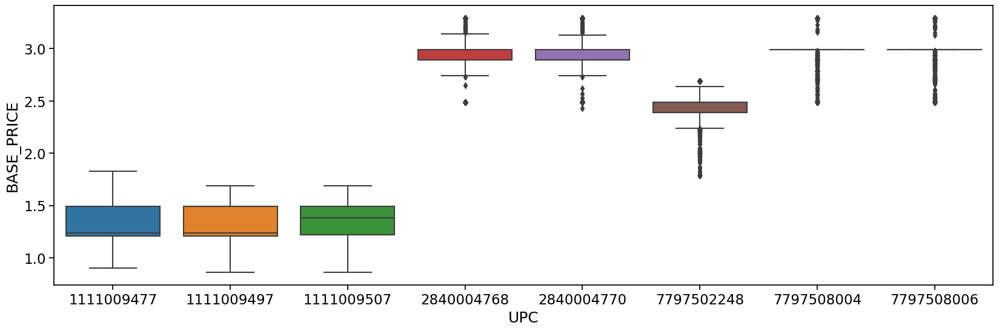

In [131]:
plt.figure(figsize=(20,6))
ax = sns.boxplot(x="UPC", y="BASE_PRICE", data=train[train['UPC'].isin(pretzels)])
product_data[product_data['UPC'].isin(pretzels)]

- All Private Label snacks have lower price. 
- The Snyder S bag snacks with a smaller size has a lower price.

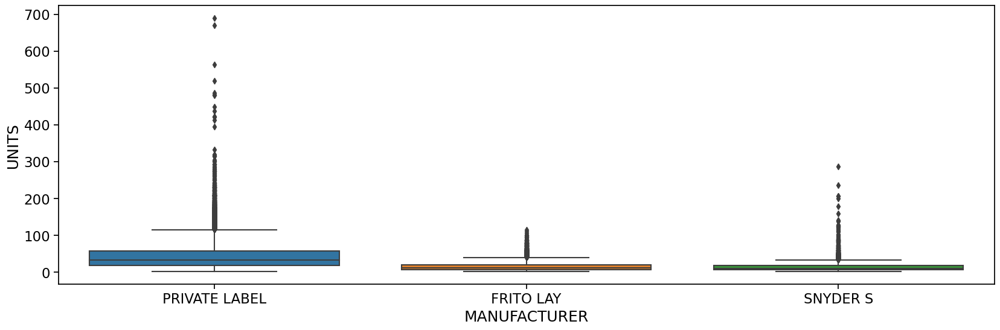

In [132]:
plt.figure(figsize=(20,6))
ax = sns.boxplot(x="MANUFACTURER", y="UNITS", data=final_data[final_data['UPC'].isin(pretzels)])

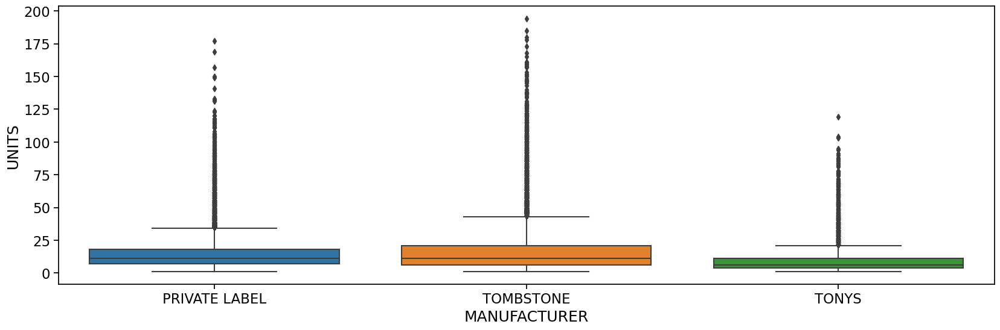

In [133]:
plt.figure(figsize=(20,6))
ax = sns.boxplot(x="MANUFACTURER", y="UNITS", data=final_data[final_data['UPC'].isin(frozen_pizza)])

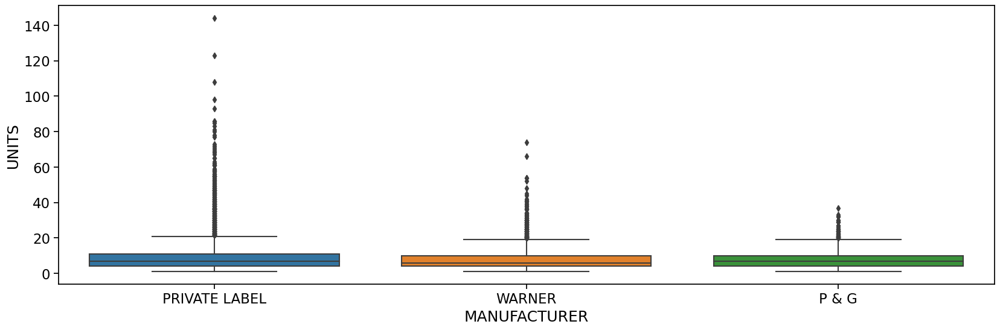

In [134]:
plt.figure(figsize=(20,6))
ax = sns.boxplot(x="MANUFACTURER", y="UNITS", data=final_data[final_data['UPC'].isin(oral_hygiene)])

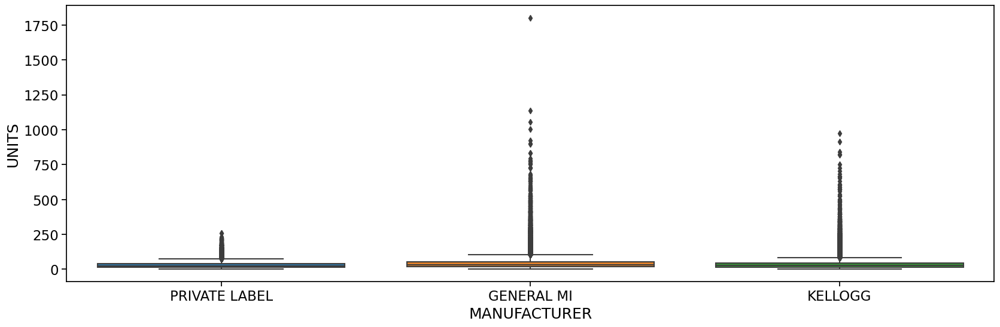

In [135]:
plt.figure(figsize=(20,6))
ax = sns.boxplot(x="MANUFACTURER", y="UNITS", data=final_data[final_data['UPC'].isin(cold_cereal)])

#### Is there a significant difference in the product sales for different regions?

#### How are the sales different for stores in different cities?

In [136]:
grouped_weekly_sales = final_data.groupby(['WEEK_END_DATE','STORE_NUM'])['UNITS'].sum().reset_index()

grouped_weekly_sales = grouped_weekly_sales.merge(store_data, how = 'left', left_on = 'STORE_NUM', right_on = 'STORE_ID')

grouped_weekly_sales = grouped_weekly_sales.sort_values(by = 'ADDRESS_STATE_PROV_CODE')

In [137]:
state = (store_data[['ADDRESS_STATE_PROV_CODE','STORE_ID']].sort_values(by ='ADDRESS_STATE_PROV_CODE'))['STORE_ID']

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72, 73, 74, 75]),
 [Text(0, 0, '4245'),
  Text(1, 0, '19265'),
  Text(2, 0, '367'),
  Text(3, 0, '11757'),
  Text(4, 0, '389'),
  Text(5, 0, '13609'),
  Text(6, 0, '15531'),
  Text(7, 0, '28909'),
  Text(8, 0, '15547'),
  Text(9, 0, '21213'),
  Text(10, 0, '21221'),
  Text(11, 0, '21227'),
  Text(12, 0, '21237'),
  Text(13, 0, '26981'),
  Text(14, 0, '11761'),
  Text(15, 0, '23061'),
  Text(16, 0, '23067'),
  Text(17, 0, '23075'),
  Text(18, 0, '24991'),
  Text(19, 0, '25001'),
  Text(20, 0, '25021'),
  Text(21, 0, '25027'),
  Text(22, 0, '26973'),
  Text(23, 0, '26983'),
  Text(24, 0, '23055'),
  Text(25, 0, '15541'),
  Text(26, 0, '9825'),
  Text(27, 0, '6179'),

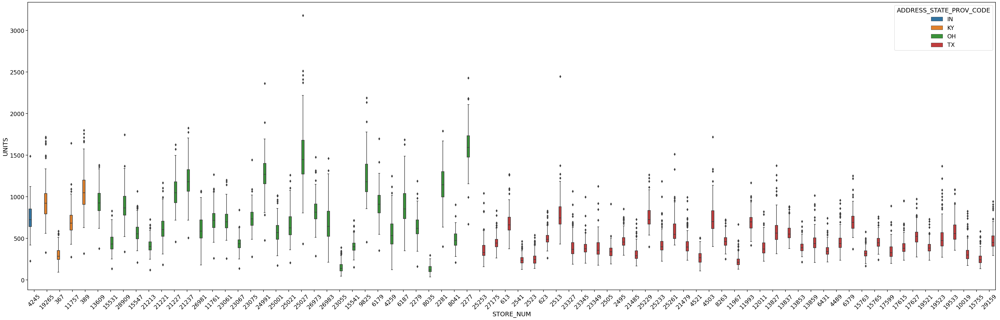

In [138]:
plt.figure(figsize=(50,15))

ax=sns.boxplot(x="STORE_NUM",y="UNITS",data=grouped_weekly_sales, hue ='ADDRESS_STATE_PROV_CODE', order =state)
plt.xticks(rotation=45)

- The most frequent colors we see are green and orange - Ohio and Texas
- Mostly the number of units is higher for Ohio (considering individual stores)

## Store Size and unit sales

- Size of Store: Stores with larger area would have more sales

In [139]:
store_agg_data = train.groupby(['STORE_NUM'])['UNITS'].sum().reset_index()

merged_store_data = store_data.merge(store_agg_data, how = 'left', left_on = 'STORE_ID', right_on = 'STORE_NUM')

<Axes: xlabel='SALES_AREA_SIZE_NUM', ylabel='Density'>

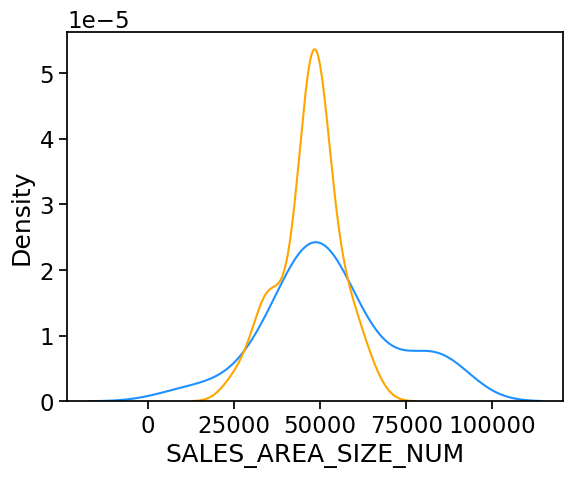

In [140]:
state_oh = merged_store_data.loc[merged_store_data['ADDRESS_STATE_PROV_CODE'] == 'OH']
state_tx = merged_store_data.loc[merged_store_data['ADDRESS_STATE_PROV_CODE'] == 'TX']

sns.distplot(state_oh['SALES_AREA_SIZE_NUM'], hist=False,color= 'dodgerblue', label= 'OHIO')
sns.distplot(state_tx['SALES_AREA_SIZE_NUM'], hist=False,  color= 'orange', label= 'TEXAS')

<Axes: xlabel='SALES_AREA_SIZE_NUM', ylabel='UNITS'>

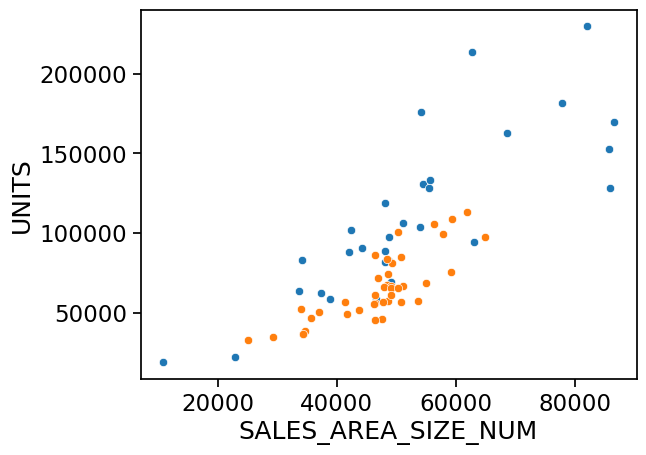

In [141]:
sns.scatterplot(x = (state_oh['SALES_AREA_SIZE_NUM']), y = (state_oh['UNITS']))
sns.scatterplot(x = (state_tx['SALES_AREA_SIZE_NUM']), y = (state_tx['UNITS']))

### Does the “Display” have more impact on demand  than Feature or is it the other way round?

In [142]:
average_demand_display = train['DISPLAY'].sum()
average_demand_feature = train['FEATURE'].sum()

In [143]:
average_demand_display

31359

In [144]:
average_demand_feature

23203

In [145]:
# Compare the impact
if average_demand_display > average_demand_feature:
    print("Display has more impact on demand than Feature.")
elif average_demand_display < average_demand_feature:
    print("Feature has more impact on demand than Display.")
else:
    print("Display and Feature have equal impact on demand.")


Display has more impact on demand than Feature.


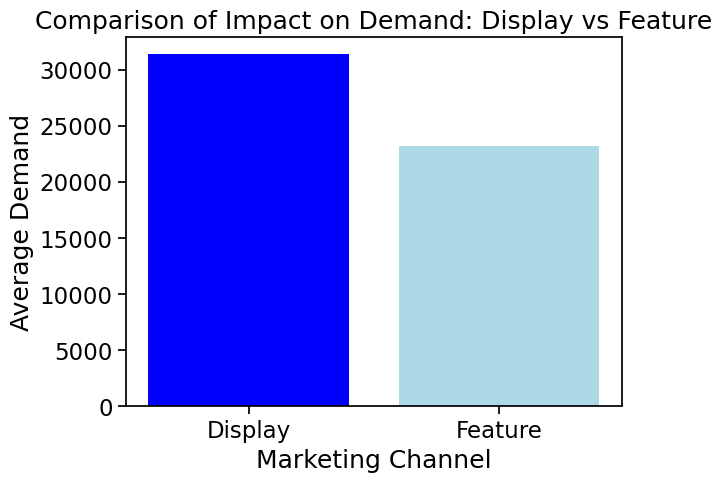

In [146]:
plt.bar(['Display', 'Feature'], [average_demand_display, average_demand_feature], color=['Blue', 'lightblue'])

# Add labels and title
plt.xlabel('Marketing Channel')
plt.ylabel('Average Demand')
plt.title('Comparison of Impact on Demand: Display vs Feature')

# Show the plot
plt.show()

- The display marketing channel is more effective at driving demand than the feature marketing channel.

### Does the number of unique manufactures for a category & subcategory(Bag snacks, Frozen pizza etc. impact the demand?

In [147]:
pd.DataFrame(product_data[["MANUFACTURER","CATEGORY","SUB_CATEGORY"]].value_counts(ascending=True)).sort_values("MANUFACTURER")

count
MANUFACTURER  CATEGORY              SUB_CATEGORY                      
FRITO LAY     BAG SNACKS            PRETZELS                         2
GENERAL MI    COLD CEREAL           ALL FAMILY CEREAL                3
KELLOGG       COLD CEREAL           ALL FAMILY CEREAL                1
                                    KIDS CEREAL                      2
P & G         ORAL HYGIENE PRODUCTS MOUTHWASH/RINSES AND SPRAYS      1
                                    MOUTHWASHES (ANTISEPTIC)         1
PRIVATE LABEL COLD CEREAL           ADULT CEREAL                     1
                                    ALL FAMILY CEREAL                2
              ORAL HYGIENE PRODUCTS MOUTHWASHES (ANTISEPTIC)         2
              BAG SNACKS            PRETZELS                         3
              FROZEN PIZZA          PIZZA/PREMIUM                    3
SNYDER S      BAG SNACKS            PRETZELS                         3
TOMBSTONE     FROZEN PIZZA          PIZZA/PREMIUM                    3
TONYS         FROZEN PIZZA          PIZZA/PREMIUM                    1
WARNER        ORAL HYGIENE PRODUCTS MOUTHWASHES (ANTISEPTIC)         2

In [148]:
# Assuming you already have product_data and final_data DataFrames

manufacturers_per_category_subcategory = product_data.groupby(['CATEGORY', 'SUB_CATEGORY'])['MANUFACTURER'].nunique()

data = pd.merge(product_data, manufacturers_per_category_subcategory, on=['CATEGORY', 'SUB_CATEGORY'], suffixes=('', '_UNIQUE_MANUFACTURERS'))

demand_by_unique_manufacturers_total = final_data.groupby('MANUFACTURER')['UNITS'].sum()

print(demand_by_unique_manufacturers_total)


MANUFACTURER
FRITO LAY         241407
GENERAL MI       1495632
KELLOGG          1270974
P & G              19661
PRIVATE LABEL    2734456
SNYDER S          161998
TOMBSTONE         514126
TONYS              38712
WARNER             41826
Name: UNITS, dtype: int64


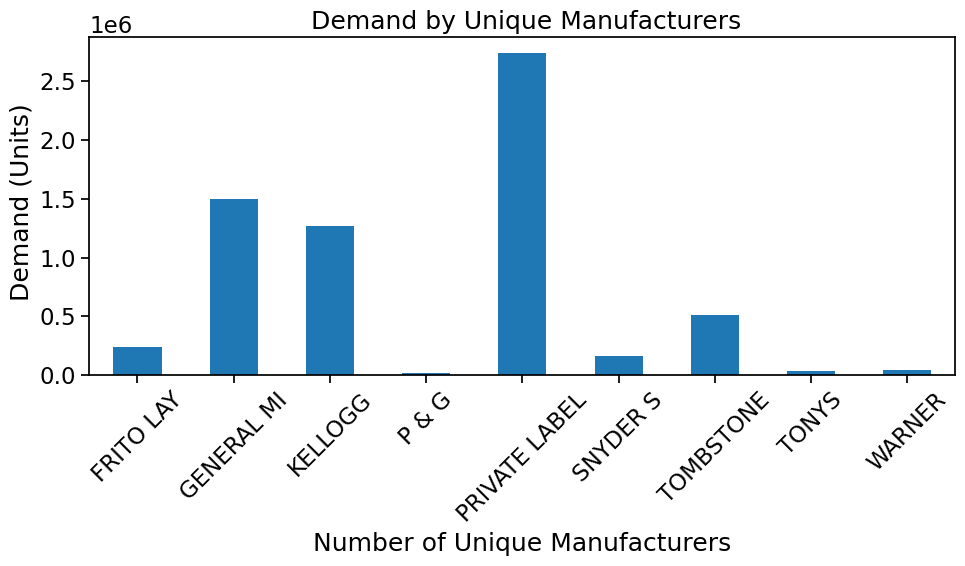

In [149]:
demand_by_unique_manufacturers_total.plot(kind='bar', figsize=(10, 6))
plt.title(' Demand by Unique Manufacturers')
plt.xlabel('Number of Unique Manufacturers')
plt.ylabel(' Demand (Units)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

`Private Label` is the most demanded, selling `2,734,456 units`, followed by `General Mills` at `1,495,632 units.` `Frito Lay`and `Kellogg` are also significant contributors to total sales.

## 3. One hypothesis you think should be tested with the given dataset. Demonstrate with plots?



### Calculate the relative price (discount) for each product

In [150]:
train['DISCOUNT'] = train['BASE_PRICE'] - train['PRICE']

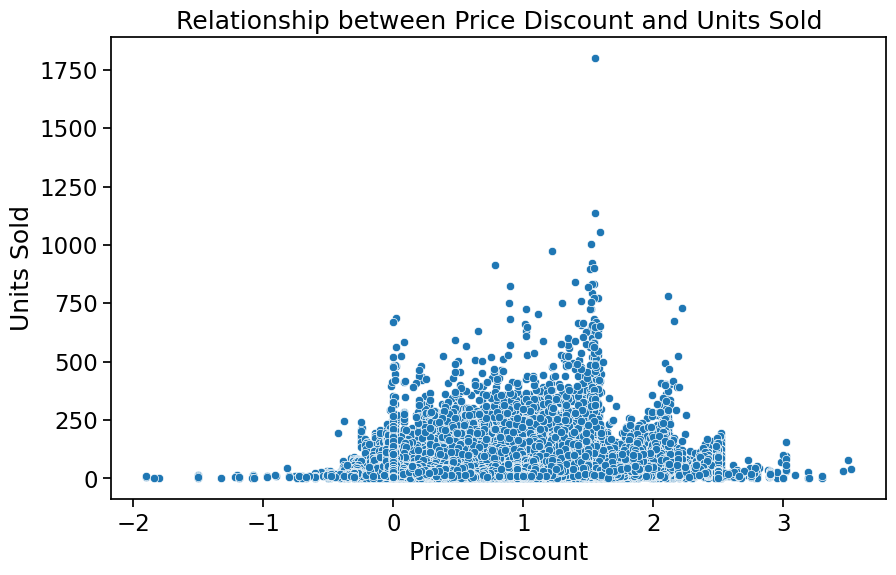

In [151]:
# Plotting the relationship between price and units sold
plt.figure(figsize=(10, 6))
sns.scatterplot(x='DISCOUNT', y='UNITS', data=train)
plt.title('Relationship between Price Discount and Units Sold')
plt.xlabel('Price Discount')
plt.ylabel('Units Sold')
plt.show()

### `MY_observation:`
- when items are sold at a lower price than usual, more of them are bought.

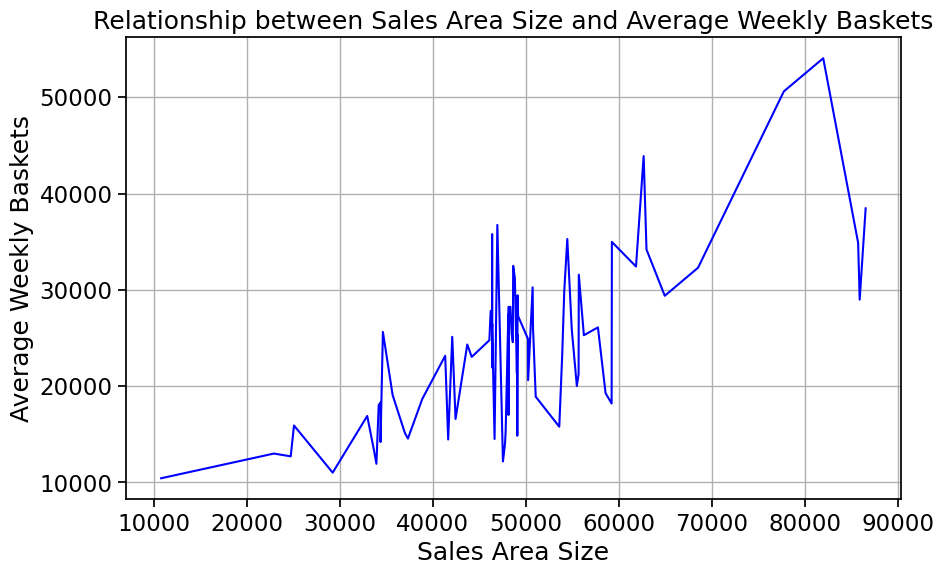

In [152]:
df_sorted = store_data.sort_values(by='SALES_AREA_SIZE_NUM')

# Plotting the relationship between sales area size and average weekly number of baskets
plt.figure(figsize=(10, 6))
plt.plot(df_sorted['SALES_AREA_SIZE_NUM'], df_sorted['AVG_WEEKLY_BASKETS'], color='blue')
plt.title('Relationship between Sales Area Size and Average Weekly Baskets')
plt.xlabel('Sales Area Size')
plt.ylabel('Average Weekly Baskets')
plt.grid(True)
plt.show()

__Big stores, with lots of space to shop, tend to sell more things every week than smaller stores.__

### Seasonal Sales Variation Impact on Monthly Unit Sales

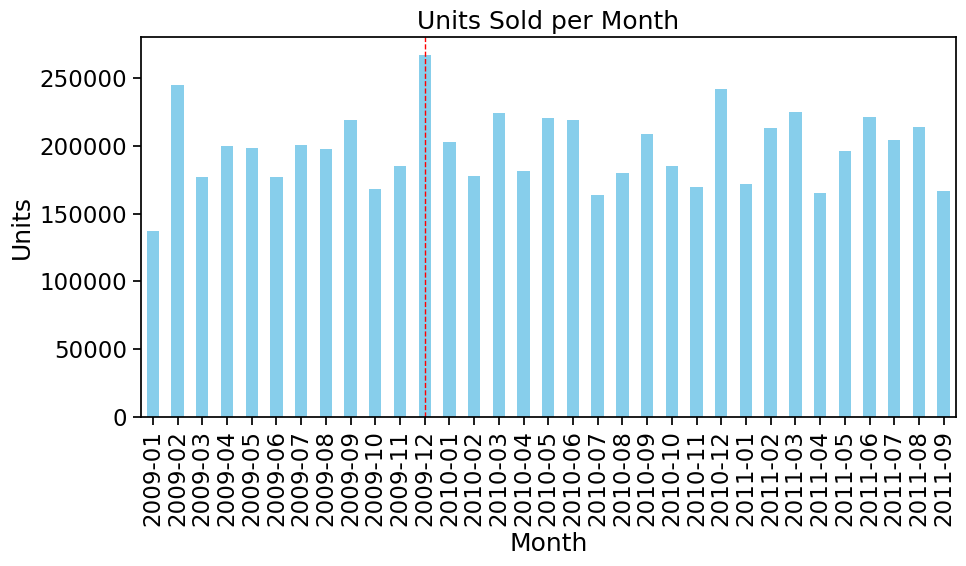

In [153]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'train' is your DataFrame

# Convert WEEK_END_DATE to datetime if it's not already
train['WEEK_END_DATE'] = pd.to_datetime(train['WEEK_END_DATE'])

# Group by month and sum UNITS
units_by_month = train.groupby(train['WEEK_END_DATE'].dt.to_period('M'))['UNITS'].sum()

# Find the month with the maximum units
max_units_month = units_by_month.idxmax()

# Plot the graph
plt.figure(figsize=(10, 6))
units_by_month.plot(kind='bar', color='skyblue')
plt.title('Units Sold per Month')
plt.xlabel('Month')
plt.ylabel('Units')
plt.xticks(rotation=90)

# Find the index position of the max month
max_month_index = units_by_month.index.get_loc(max_units_month)

# Highlight the month with the most units
plt.axvline(x=max_month_index, color='red', linestyle='--', linewidth=1)

plt.tight_layout()
plt.show()
